In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

import gymnasium as gym
from gymnasium import spaces
from gymnasium.envs.registration import register

Calculating discounted returns for agent strategies
                              
Discounted returns help in evaluating the total amount of rewards an agent can expect to accumulate over time, taking into account that future rewards are less valuable than immediate rewards. You are given the expected rewards for two different strategies (exp_rewards_strategy_1 and exp_rewards_strategy_2) of an RL agent. Your task is to calculate the discounted return for each strategy and determine which one yields the higher return.

In [2]:
exp_rewards_strategy_1 = np.array([3, 2, -1, 5])
exp_rewards_strategy_2 = np.array([6, -5, -3, -2])

discount_factor = 0.9

In [3]:
# Compute discounts
discounts_strategy_1 = np.array([exp_rewards_strategy_1[i]*discount_factor**i for i in range(len(exp_rewards_strategy_1))])
discounts_strategy_1

array([ 3.   ,  1.8  , -0.81 ,  3.645])

In [4]:
# Compute the discounted return
discounted_return_strategy_1 = np.sum(discounts_strategy_1)

print(f"The discounted return of the first strategy is {discounted_return_strategy_1}")

The discounted return of the first strategy is 7.635


In [5]:
# Compute discounts
discounts_strategy_2 = np.array([exp_rewards_strategy_2[i]*discount_factor**i for i in range(len(exp_rewards_strategy_2))])
discounts_strategy_2

array([ 6.   , -4.5  , -2.43 , -1.458])

In [6]:
# Compute the discounted return
discounted_return_strategy_2 = np.sum(discounts_strategy_2)

print(f"The discounted return of the second strategy is {discounted_return_strategy_2}")

The discounted return of the second strategy is -2.3880000000000003


Setting up a Mountain Car environment

One of the most common Gym environments is Mountain Car, where the goal is to drive an underpowered car up a steep hill. The car's engine isn't strong enough to climb the hill in a single pass, so the car needs to build up momentum by driving back and forth. Your task is to create and set up this environment.

In [7]:
# Create the environment
env = gym.make(id='MountainCar-v0', render_mode='rgb_array')
env

<TimeLimit<OrderEnforcing<PassiveEnvChecker<MountainCarEnv<MountainCar-v0>>>>>

In [8]:
# Get the initial state
initial_state, info = env.reset(seed=42)
initial_state, info

(array([-0.4452088,  0.       ], dtype=float32), {})

In [9]:
position = initial_state[0]
velocity = initial_state[1]

print(f"The position of the car along the x-axis is {position} (m)")
print(f"The velocity of the car is {velocity} (m/s)")

The position of the car along the x-axis is -0.4452087879180908 (m)
The velocity of the car is 0.0 (m/s)


Visualizing the Mountain Car Environment

Now, you'll take a step further in your exploration of the Mountain Car environment. Visualization is a key aspect of understanding the dynamics of RL environments. You'll write a function render() that displays the current state of the environment. This function will be used later on for any environment you want to visualize.

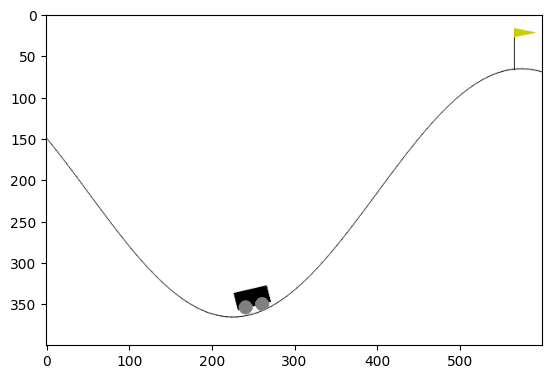

In [10]:
# Complete the render function
def render():
    state_image = env.render()
    plt.imshow(state_image)
    plt.show()

# Call the render function    
render()

Interacting with the Frozen Lake environment

Now you'll navigate the Frozen Lake environment, a grid-based world where actions move an agent in specific directions. Your task is to carefully look at the environment, and manually define a list of actions that will navigate the agent from the start (top left) to the goal (bottom right) without falling into any holes. In the Frozen Lake environment, actions are typically represented as:

0: left
1: down
2: right
3: up

After running your code, be sure to navigate through your plots to see the path taken by using the 'Previous Plot' and 'Next Plot' buttons. This will help you understand the sequence of actions and their outcomes.

In [11]:
env = gym.make("FrozenLake-v1", is_slippery=False, render_mode="rgb_array")
env

<TimeLimit<OrderEnforcing<PassiveEnvChecker<FrozenLakeEnv<FrozenLake-v1>>>>>

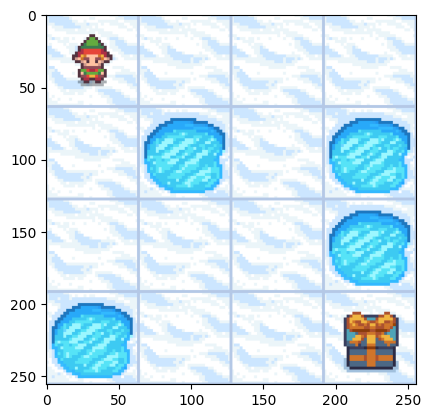

(0, {'prob': 1})

In [12]:
# Get the initial state
initial_state, info = env.reset()
render()
initial_state, info

In [13]:
env.unwrapped.P # {state: {action: [(probability, next_state, reward, done)]}}
# deterministic environment (100% probability of ending in the next state, according to the command executed): MDP not used

{0: {0: [(1.0, 0, 0.0, False)],
  1: [(1.0, 4, 0.0, False)],
  2: [(1.0, 1, 0.0, False)],
  3: [(1.0, 0, 0.0, False)]},
 1: {0: [(1.0, 0, 0.0, False)],
  1: [(1.0, 5, 0.0, True)],
  2: [(1.0, 2, 0.0, False)],
  3: [(1.0, 1, 0.0, False)]},
 2: {0: [(1.0, 1, 0.0, False)],
  1: [(1.0, 6, 0.0, False)],
  2: [(1.0, 3, 0.0, False)],
  3: [(1.0, 2, 0.0, False)]},
 3: {0: [(1.0, 2, 0.0, False)],
  1: [(1.0, 7, 0.0, True)],
  2: [(1.0, 3, 0.0, False)],
  3: [(1.0, 3, 0.0, False)]},
 4: {0: [(1.0, 4, 0.0, False)],
  1: [(1.0, 8, 0.0, False)],
  2: [(1.0, 5, 0.0, True)],
  3: [(1.0, 0, 0.0, False)]},
 5: {0: [(1.0, 5, 0, True)],
  1: [(1.0, 5, 0, True)],
  2: [(1.0, 5, 0, True)],
  3: [(1.0, 5, 0, True)]},
 6: {0: [(1.0, 5, 0.0, True)],
  1: [(1.0, 10, 0.0, False)],
  2: [(1.0, 7, 0.0, True)],
  3: [(1.0, 2, 0.0, False)]},
 7: {0: [(1.0, 7, 0, True)],
  1: [(1.0, 7, 0, True)],
  2: [(1.0, 7, 0, True)],
  3: [(1.0, 7, 0, True)]},
 8: {0: [(1.0, 8, 0.0, False)],
  1: [(1.0, 12, 0.0, True)],
  2: [(

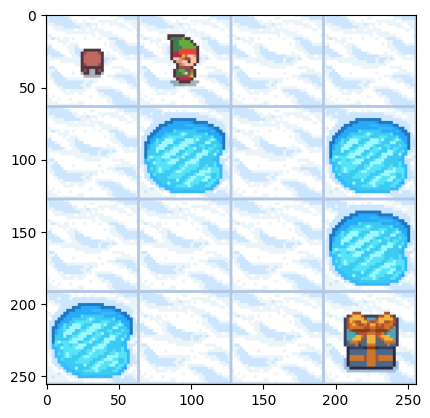

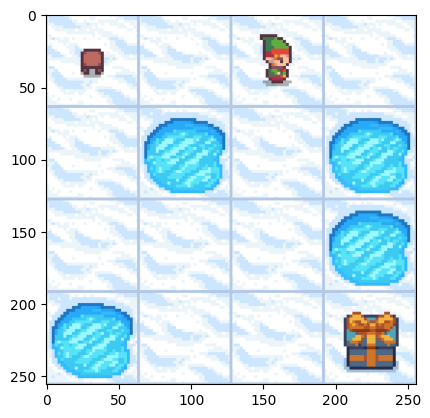

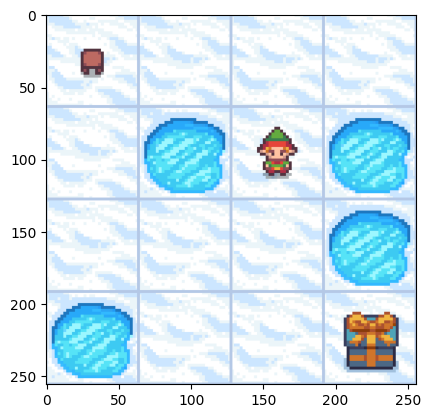

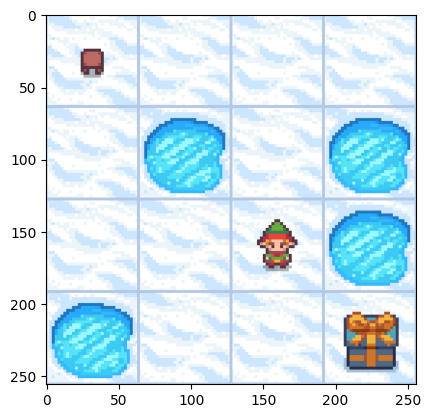

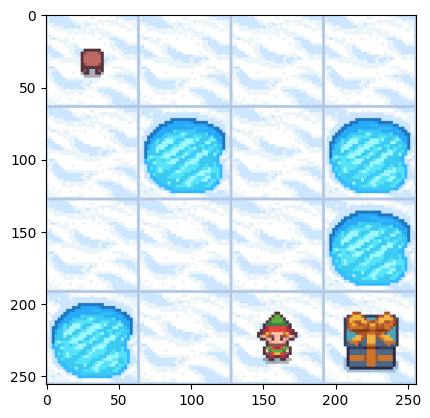

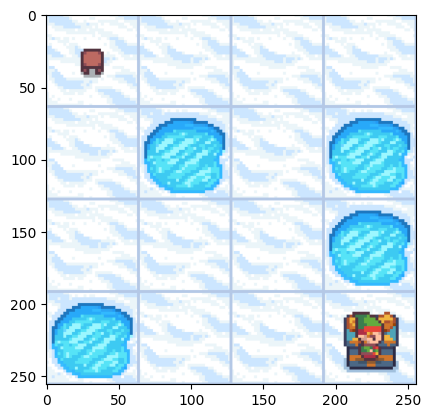

You reached the goal!


In [14]:
# Define the sequence of actions
actions = [2,2,1,1,1,2]

for action in actions:
  # Execute each action
  state, reward, terminated, _, _ = env.step(action)
  # Render the environment
  render()
  if terminated:
  	print("You reached the goal!")

Custom Frozen Lake MDP components

The provided grid world environment is a variation of the Frozen Lake environment where an agent must navigate to a goal while avoiding holes. Your task is to analyze this environment and frame it as an MDP by answering specific questions.

In [15]:
env = gym.make("FrozenLake-v1", is_slippery=True, render_mode="rgb_array") # adding MDP setting is_slippery=True
env

<TimeLimit<OrderEnforcing<PassiveEnvChecker<FrozenLakeEnv<FrozenLake-v1>>>>>

In [16]:
env.action_space

Discrete(4)

In [17]:
env.observation_space

Discrete(16)

In [18]:
env.unwrapped.P # stochastic environment, with various probabilities of ending to the next state, independently from the command executed: MDP used

{0: {0: [(0.3333333333333333, 0, 0.0, False),
   (0.3333333333333333, 0, 0.0, False),
   (0.3333333333333333, 4, 0.0, False)],
  1: [(0.3333333333333333, 0, 0.0, False),
   (0.3333333333333333, 4, 0.0, False),
   (0.3333333333333333, 1, 0.0, False)],
  2: [(0.3333333333333333, 4, 0.0, False),
   (0.3333333333333333, 1, 0.0, False),
   (0.3333333333333333, 0, 0.0, False)],
  3: [(0.3333333333333333, 1, 0.0, False),
   (0.3333333333333333, 0, 0.0, False),
   (0.3333333333333333, 0, 0.0, False)]},
 1: {0: [(0.3333333333333333, 1, 0.0, False),
   (0.3333333333333333, 0, 0.0, False),
   (0.3333333333333333, 5, 0.0, True)],
  1: [(0.3333333333333333, 0, 0.0, False),
   (0.3333333333333333, 5, 0.0, True),
   (0.3333333333333333, 2, 0.0, False)],
  2: [(0.3333333333333333, 5, 0.0, True),
   (0.3333333333333333, 2, 0.0, False),
   (0.3333333333333333, 1, 0.0, False)],
  3: [(0.3333333333333333, 2, 0.0, False),
   (0.3333333333333333, 1, 0.0, False),
   (0.3333333333333333, 0, 0.0, False)]},
 2:

Exploring state and action spaces

The Cliff Walking environment involves an agent crossing a grid world from start to goal while avoiding falling off a cliff. If the player moves to a cliff location it returns to the start location. The player makes moves until they reach the goal, which ends the episode. Your task is to explore the state and action spaces of this environment.

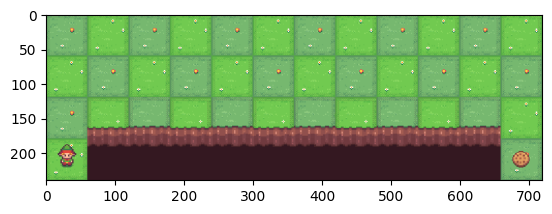

In [19]:
# Create the Cliff Walking environment
env = gym.make('CliffWalking-v0', render_mode="rgb_array")

env.reset()
render()

In [20]:
# Compute the size of the action space
num_actions = env.action_space.n

# Compute the size of the state space
num_states = env.observation_space.n

print("Number of actions:", num_actions)
print("Number of states:", num_states)

Number of actions: 4
Number of states: 48


Transition probabilities and rewards

The Cliff Walking environment has 48 states, numbered from 0 to 47, line by line, from the upper left corner (0) to the lower right corner (47). Your goal is to investigate the structure of transition probabilities and rewards within this setup. Notably, all rewards, including the reward for reaching the goal, are negative in this environment. This design choice emphasizes minimizing the number of steps taken, as each step incurs a penalty, making efficiency a key aspect for designing effective learning algorithms.

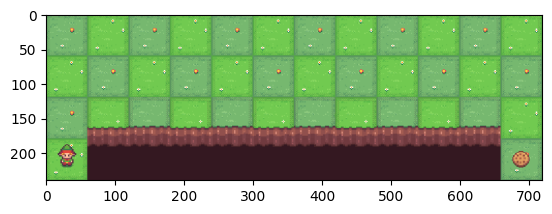

In [21]:
# Choose the state
state = 35 # last state before success state

render()

In [22]:
# Extract transitions for each state-action pair
for action in range(num_actions):
    transitions = env.unwrapped.P[state][action]
    # Print details of each transition
    for transition in transitions:
        probability, next_state, reward, done = transition
        print(f"Probability: {probability}, Next State: {next_state}, Reward: {reward}, Done: {done}")

Probability: 1.0, Next State: 23, Reward: -1, Done: False
Probability: 1.0, Next State: 35, Reward: -1, Done: False
Probability: 1.0, Next State: 47, Reward: -1, Done: True
Probability: 1.0, Next State: 34, Reward: -1, Done: False


Defining a deterministic policy

In this exercise, you'll be working with a custom environment called MyGridWorld, the same one you've seen in the video. This environment is a grid world where the agent's goal is to reach the diamond as quickly as possible. Your task is to define a policy that guides the agent's behavior as specified in the figure below.

Image showing the policy:  states 0, 1, 6, 7 - action right.  states 2, 3 - action down.  states 4, 5 - action left.

Actions are represented as: (0 → left, 1 → down, 2 → right, 3 → up).

In [23]:
register(
    id="MyGridWorld-v0",
    entry_point="my_gridworld:MyGridWorld",  # Reference the file and class name
)

In [24]:
# Create the environment
env = gym.make('MyGridWorld-v0', render_mode='rgb_array')
env

<OrderEnforcing<PassiveEnvChecker<MyGridWorld<MyGridWorld-v0>>>>

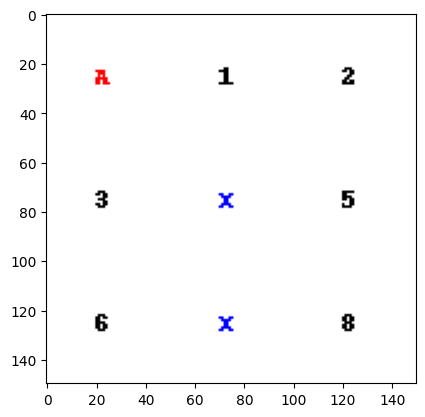

(0, {})

In [25]:
state, info = env.reset()
render()
state, info

Current state: 1
Reward received: -1
Terminated: False
Truncated: False
Additional info: {}
Transition details for state 1, action 2:
  - Probability: 1.0 (chance of this transition occurring)
  - Next State: 2 (state after taking the action)
  - Reward: -1 (reward for this transition)
  - Done: False (whether the episode ends after this transition)
Cumulative reward so far: -1


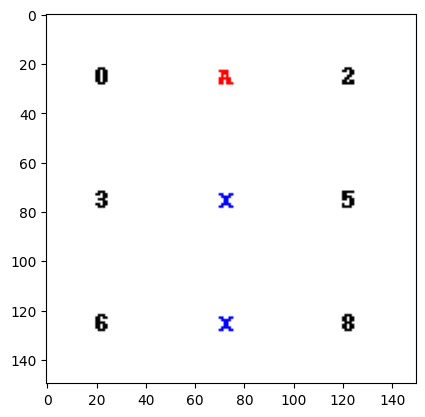

Current state: 2
Reward received: -1
Terminated: False
Truncated: False
Additional info: {}
Transition details for state 2, action 2:
  - Probability: 1.0 (chance of this transition occurring)
  - Next State: 2 (state after taking the action)
  - Reward: -2 (reward for this transition)
  - Done: False (whether the episode ends after this transition)
Cumulative reward so far: -2


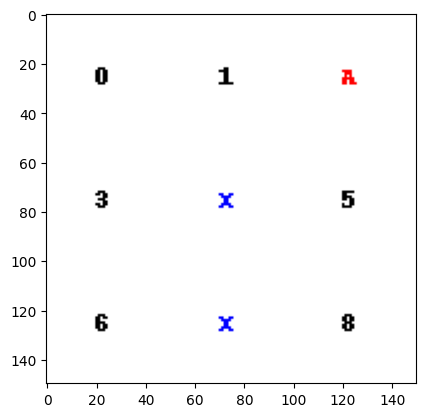

Current state: 5
Reward received: -1
Terminated: False
Truncated: False
Additional info: {}
Transition details for state 5, action 1:
  - Probability: 1.0 (chance of this transition occurring)
  - Next State: 8 (state after taking the action)
  - Reward: 10 (reward for this transition)
  - Done: True (whether the episode ends after this transition)
Cumulative reward so far: -3


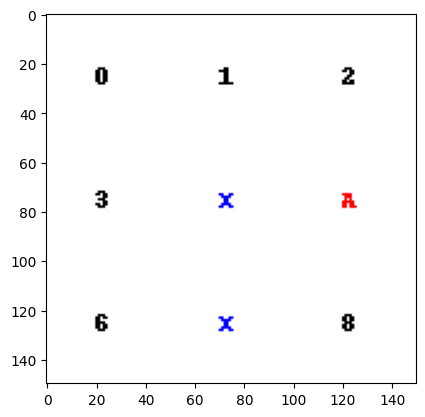

Current state: 4
Reward received: -3
Terminated: False
Truncated: False
Additional info: {}
Transition details for state 4, action 0:
  - Probability: 1.0 (chance of this transition occurring)
  - Next State: 3 (state after taking the action)
  - Reward: -1 (reward for this transition)
  - Done: False (whether the episode ends after this transition)
Cumulative reward so far: -6


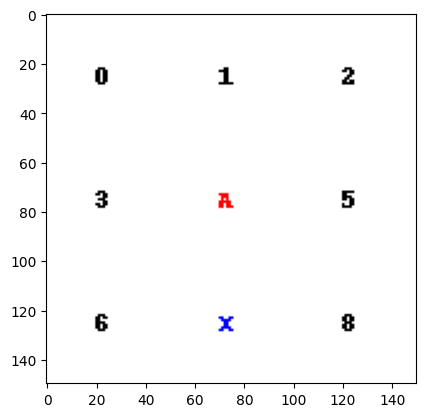

Current state: 3
Reward received: -1
Terminated: False
Truncated: False
Additional info: {}
Transition details for state 3, action 0:
  - Probability: 1.0 (chance of this transition occurring)
  - Next State: 3 (state after taking the action)
  - Reward: -2 (reward for this transition)
  - Done: False (whether the episode ends after this transition)
Cumulative reward so far: -7


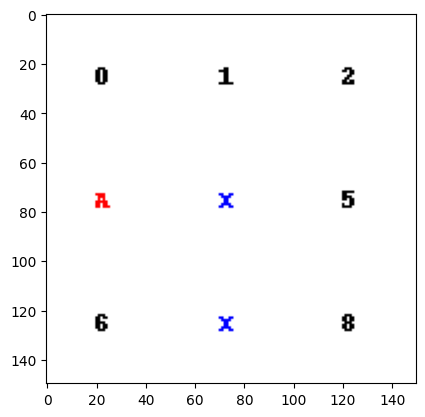

Current state: 6
Reward received: -1
Terminated: False
Truncated: False
Additional info: {}
Transition details for state 6, action 1:
  - Probability: 1.0 (chance of this transition occurring)
  - Next State: 6 (state after taking the action)
  - Reward: -2 (reward for this transition)
  - Done: False (whether the episode ends after this transition)
Cumulative reward so far: -8


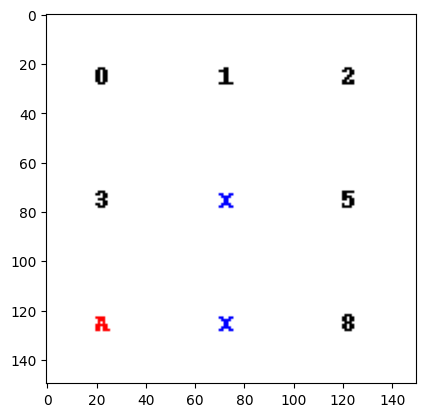

Current state: 7
Reward received: -3
Terminated: False
Truncated: False
Additional info: {}
Transition details for state 7, action 2:
  - Probability: 1.0 (chance of this transition occurring)
  - Next State: 8 (state after taking the action)
  - Reward: 10 (reward for this transition)
  - Done: True (whether the episode ends after this transition)
Cumulative reward so far: -11


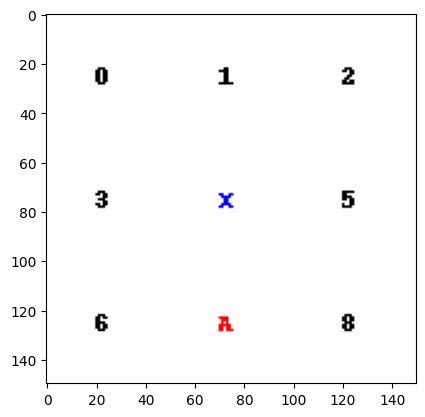

Current state: 8
Reward received: 10
Terminated: True
Truncated: False
Additional info: {}
Transition details for state 8, action 2:
  - Probability: 1.0 (chance of this transition occurring)
  - Next State: 8 (state after taking the action)
  - Reward: -2 (reward for this transition)
  - Done: True (whether the episode ends after this transition)
Cumulative reward so far: -1


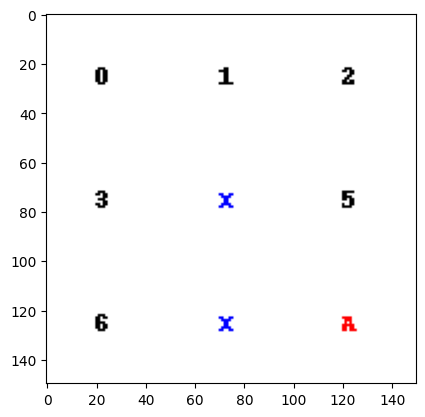

In [26]:
# Define the policy
policy = {0: 2, 1: 2, 2: 1, 3: 1, 4: 0, 5: 0, 6: 2, 7: 2}
total_reward = 0
terminated = False

while not terminated:
    # Select action based on policy
    action = policy[state]
    state, reward, terminated, truncated, info = env.step(action)

    # Print detailed information to understand each step
    print(f"Current state: {state}")
    print(f"Reward received: {reward}")
    print(f"Terminated: {terminated}")
    print(f"Truncated: {truncated}")
    print(f"Additional info: {info}")

    # Print transition probabilities and explain the meaning of each value
    print(f"Transition details for state {state}, action {action}:")
    for transition in env.unwrapped.P[state][action]:
        probability, next_state, transition_reward, done = transition
        print(f"  - Probability: {probability} (chance of this transition occurring)")
        print(f"  - Next State: {next_state} (state after taking the action)")
        print(f"  - Reward: {transition_reward} (reward for this transition)")
        print(f"  - Done: {done} (whether the episode ends after this transition)")

    total_reward += reward
    print(f"Cumulative reward so far: {total_reward}")

    # Render the environment
    render()


Computing state-values for a policy

Using the same deterministic environment MyGridWorld, now you need to evaluate the effectiveness of the policy you defined in the previous exercise. You'll do this by computing the state value function for each state under this policy.

The environment has been imported as env along with the necessary variables needed (terminal_state, num_states, policy, gamma).

In [27]:
terminal_state = 8
num_states = 9
gamma = 1.0

In [28]:
# Function to compute the state value for a given state
# This function is a recursive implementation to compute the state value 
# 𝑉(𝑠) for a given state in the context of a Markov Decision Process (MDP).

def compute_state_value(state):
    # Base case: If the current state is the terminal state
    # In a terminal state, there are no future rewards, so the value is 0
    if state == terminal_state:
        return 0

    # Select the action to take in the current state based on the policy
    # `policy[state]` retrieves the action assigned to this state in the policy
    action = policy[state]

    # Retrieve the transition details for the given state and action
    # `env.unwrapped.P[state][action]` returns a list of all possible transitions,
    # but we assume this environment is deterministic, so we only take the first transition ([0])
    # Each transition is a tuple: (probability, next_state, reward, done)
    _, next_state, reward, _ = env.unwrapped.P[state][action][0]

    # Compute the state value recursively
    # `reward` is the immediate reward for taking the action in this state
    # `gamma` is the discount factor, which determines the importance of future rewards
    # `compute_state_value(next_state)` calculates the value of the next state recursively
    return reward + gamma * compute_state_value(next_state)


In [29]:
print(state, reward)
compute_state_value(state)

8 10


0

In [30]:
env.unwrapped.P[state][action][0]

(1.0, 8, -2, True)

In [31]:
# Compute all state values 
state_values = {state: compute_state_value(state) for state in range(num_states)}
state_values

# the state value function is effectively evaluating the given policy in MyGridWorld

{0: -1.0, 1: 0.0, 2: 1.0, 3: 6.0, 4: 5.0, 5: 2.0, 6: 7.0, 7: 10.0, 8: 0}

Comparing policies

You are given two state value functions (value_function_1 and value_function_2) corresponding to two different policies in the MyGridWorld environment. Your task is to compare these state value functions on a state-by-state basis to determine which policy is more effective.

In [32]:
value_function_1 = {0: 1, 1: 2, 2: 3, 3: 7, 4: 6, 5: 4, 6: 8, 7: 10, 8: 0}
value_function_2 = {0: 7, 1: 8, 2: 9, 3: 7, 4: 9, 5: 10, 6: 8, 7: 10, 8: 0}

# Check for each value in policy 1 if it is better than policy 2
one_is_better = [value_function_1[state] >= value_function_2[state] for state in range(num_states)]

# Check for each value in policy 2 if it is better than policy 1
two_is_better = [value_function_2[state] >= value_function_1[state] for state in range(num_states)]

if all(one_is_better):
  print("Policy 1 is better.")
elif all(two_is_better):
  print("Policy 2 is better.")
else:
  print("Neither policy is uniformly better across all states.")

Policy 2 is better.


Computing Q-values

Your goal is to compute the action-values, also known as Q-values, for each state-action pair in the custom MyGridWorld environment when following the below policy. In RL, Q-values are essential because they represent the expected utility of executing a specific action in a given state, followed by adherence to the policy.

In [33]:
def compute_q_value(state, action):
    """
    Compute the action-value (Q-value) for a given state-action pair.

    Parameters:
    - state (int): The current state.
    - action (int): The action to evaluate.

    Returns:
    - q_value (float): The computed Q-value for the state-action pair,
      combining immediate reward and discounted future rewards.
    - None: If the state is terminal (no future rewards).

    Explanation:
    Q-value represents the expected cumulative reward when:
    - Starting from the given state.
    - Taking the specified action.
    - Following an optimal policy thereafter.
    """
    if state == terminal_state:  # Terminal state has no Q-value (no further actions can be taken)
        return None

    # Retrieve transition details for the given state and action
    # `env.unwrapped.P[state][action][0]` provides the transition details (prob, next_state, reward, done)
    probability, next_state, reward, done = env.unwrapped.P[state][action][0]

    # Compute the Q-value as:
    # Immediate reward + (discount factor * value of the next state)
    q_value = reward + gamma * compute_state_value(next_state)

    return q_value


In [34]:
compute_q_value(7, 2)

10.0

In [35]:
# Compute Q-values for each state-action pair
Q = {(state, action): compute_q_value(state, action) for state in range(num_states) for action in range(num_actions)}
Q

{(0, 0): -3.0,
 (0, 1): 5.0,
 (0, 2): -1.0,
 (0, 3): -3.0,
 (1, 0): -2.0,
 (1, 1): 2.0,
 (1, 2): 0.0,
 (1, 3): -2.0,
 (2, 0): -1.0,
 (2, 1): 1.0,
 (2, 2): -1.0,
 (2, 3): -1.0,
 (3, 0): 4.0,
 (3, 1): 6.0,
 (3, 2): 2.0,
 (3, 3): -2.0,
 (4, 0): 5.0,
 (4, 1): 7.0,
 (4, 2): 1.0,
 (4, 3): -1.0,
 (5, 0): 2.0,
 (5, 1): 10.0,
 (5, 2): 0.0,
 (5, 3): 0.0,
 (6, 0): 5.0,
 (6, 1): 5.0,
 (6, 2): 7.0,
 (6, 3): 5.0,
 (7, 0): 6.0,
 (7, 1): 8.0,
 (7, 2): 10.0,
 (7, 3): 2.0,
 (8, 0): None,
 (8, 1): None,
 (8, 2): None,
 (8, 3): None}

Improving a policy

In the previous exercise, you computed the Q-values for each state-action pair in the MyGridWorld environment. Now, you'll use these Q-values to improve the existing policy. Policy improvement is a critical step in reinforcement learning, where you enhance the policy by choosing actions that maximize the expected utility (Q-value) in each state. After improving the policy, you will render the new movements according to this improved policy.

In [36]:
Q[(7,2)]

10.0

In [37]:
# improved_policy = {}

# for state in range(num_states-1): # excluding last termination state, over which we don't need to calculate the best action
#     # Find the best action for each state based on Q-values
#     max_action = max(range(num_actions), key=lambda action: Q[(state, action)])
#     improved_policy[state] = max_action
    
# improved_policy

In [38]:
improved_policy = {}
# Find the best action for each state based on Q-values
for state in range(num_states-1): # excluding last termination state, over which we don't need to calculate the best action
    improved_policy[state] = np.argmax([Q[(state, action)] for action in range(num_actions)])

improved_policy

{0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 2, 7: 2}

0 1
3 -1 False False {}


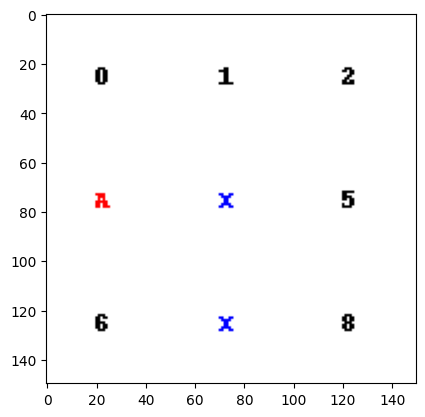

3 1
6 -1 False False {}


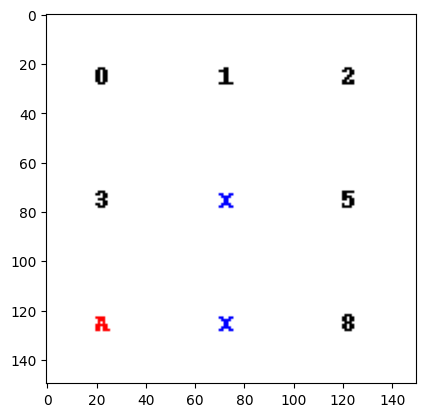

6 2
7 -3 False False {}


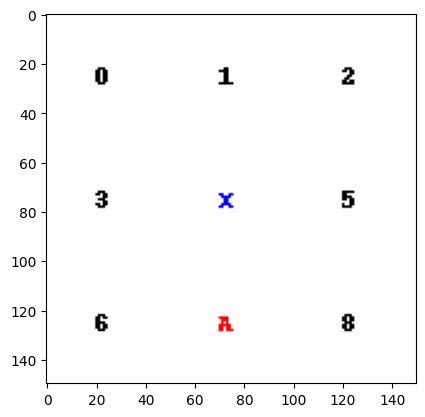

7 2
8 10 True False {}


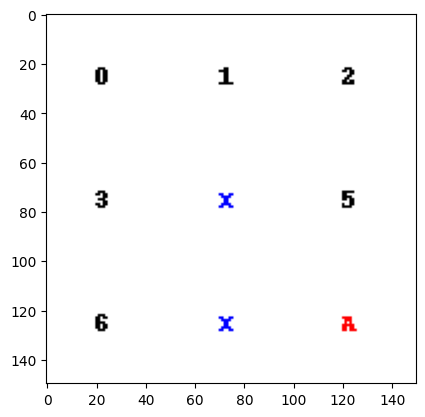

In [39]:
terminated = False

# Set a custom state (e.g., state 0)
state = 0
env.unwrapped.set_state(state) # setting also the self.state
# When you use env.unwrapped.set_state, you're bypassing the Gymnasium wrapper (like OrderEnforcing) that restricts direct access to custom methods 
# that are not part of the standard Gym API, such as set_state. By default, the wrapped environment only exposes Gym-compatible methods like step() and reset(). 
# If you define custom methods like set_state, they won't be directly accessible unless you "unwrap" the environment.

while not terminated:
    # Select action based on improved policy 
    action = improved_policy[state]
    print(state, action)
    
    # Execute the action
    state, reward, terminated, truncated, info = env.step(action)
    print(state, reward, terminated, truncated, info)
    
    render()

Applying policy iteration for optimal policy
                         
Policy iteration is a fundamental technique in RL for finding an optimal policy. It involves two main steps: policy evaluation, where you calculate the state-value function for a given policy, and policy improvement, where you update the policy based on these values. You'll apply these steps iteratively to converge to the optimal policy in the custom MyGridWorld environment.

In [40]:
def compute_state_value(state, policy):
    if state == terminal_state:
        return 0
    action = policy[state]
    _, next_state, reward, _ = env.unwrapped.P[state][action][0]
    return reward + gamma * compute_state_value(next_state, policy)


In [41]:
def compute_q_value(state, action, policy):
    if state == terminal_state:
        return None   
    probability, next_state, reward, done = env.unwrapped.P[state][action][0]
    return reward + gamma * compute_state_value(next_state, policy)

In [42]:
def render_policy(policy, to_render=True):
    state, info = env.reset()
    render()
    terminated = False
    states_actions = []
    while not terminated:
        # Select action based on policy 
        action = policy[state]
        state, reward, terminated, truncated, info = env.step(action)
        # Render the environment
        if to_render == True:
            render()
        states_actions.append((state, action))
    print('Total number of steps:', len(states_actions))
    return states_actions

In [43]:
# Complete the policy evaluation function
def policy_evaluation(policy):
    V = {state : compute_state_value(state, policy) for state in range(num_states)}
    return V

In [44]:
def policy_improvement(policy):
    improved_policy = {s: 0 for s in range(num_states-1)}
    Qmax = {s: 0 for s in range(num_states-1)}
    
	# Compute the Q-value for each state-action pair
    Q = {(state, action): compute_q_value(state, action, policy) for state in range(num_states) for action in range(num_actions)}
            
    # Compute the new policy based on the Q-values
    for state in range(num_states-1):
        improved_policy[state] = np.argmax([Q[(state, action)] for action in range(num_actions)])
        Qmax[state] = max([Q[(state, action)] for action in range(num_actions)])
        
    return improved_policy, Qmax


In [45]:
bad_policy =  {0: 2, 1: 2, 2: 1, 3: 3, 4: 2, 5: 1, 6: 2, 7: 3}    # base policy (bad one as a starting policy)

In [46]:

# Complete the policy iteration function
def policy_iteration(policy):
    while True:
        V = policy_evaluation(policy)
        improved_policy, Qmax = policy_improvement(policy)
        print('V', V)
        print('Qmax', Qmax)
        print('improved_policy', improved_policy,'\n')
        if improved_policy == policy: # improved policy doesn't change anymore
            break
        policy = improved_policy
    
    return policy, V


In [47]:
policy, V = policy_iteration(bad_policy)

V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 3.0, 7: 6.0, 8: 0}
Qmax {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 5.0, 7: 10.0}
improved_policy {0: 2, 1: 2, 2: 1, 3: 2, 4: 2, 5: 1, 6: 3, 7: 2} 

V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 5.0, 7: 10.0, 8: 0}
Qmax {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 7.0, 7: 10.0}
improved_policy {0: 2, 1: 2, 2: 1, 3: 2, 4: 2, 5: 1, 6: 2, 7: 2} 

V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 7.0, 7: 10.0, 8: 0}
Qmax {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 7.0, 7: 10.0}
improved_policy {0: 2, 1: 2, 2: 1, 3: 1, 4: 2, 5: 1, 6: 2, 7: 2} 

V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 7.0, 7: 10.0, 8: 0}
Qmax {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 7.0, 7: 10.0}
improved_policy {0: 2, 1: 2, 2: 1, 3: 1, 4: 2, 5: 1, 6: 2, 7: 2} 



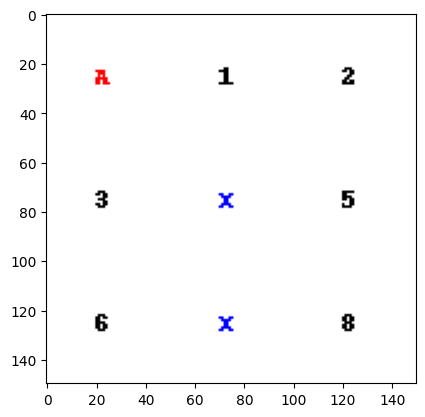

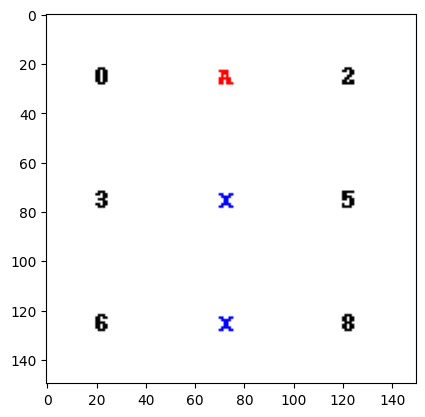

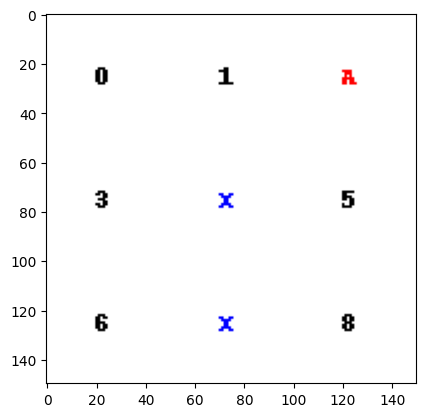

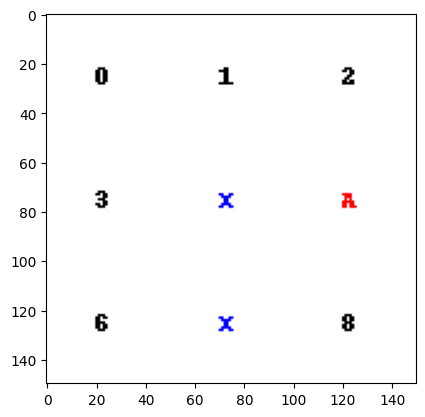

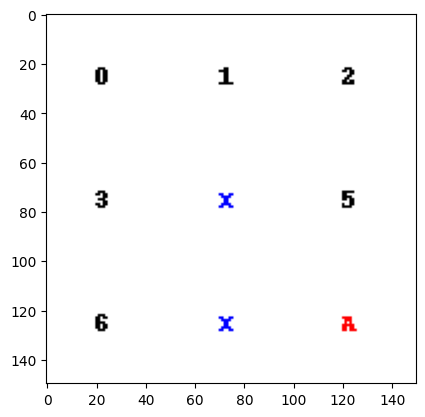

Total number of steps: 4


[(1, 2), (2, 2), (5, 1), (8, 1)]

In [48]:
render_policy(policy)

Implementing value iteration

Value iteration is a key method in RL for finding the optimal policy. It iteratively improves the value function for each state until it converges, resulting in the discovery of the optimal policy. You'll start with an initialized value function V and policy. Then, you'll update them in a loop until the value function converges and see the policy in action.

In [49]:
# For each state, find the action with the maximum Q-value and its corresponding action

def get_max_action_and_value(state, policy):
    Q_values = [compute_q_value(state, action, policy) for action in range(num_actions)]
    # max_action = max(range(num_actions), key=lambda a: Q_values[a])
    # max_q_value = Q_values[max_action]
    max_q_value = max(Q_values)
    max_action = np.argmax(Q_values)
    return max_action, max_q_value

In [50]:
[get_max_action_and_value(i, policy) for i in range(num_states-1)]

[(2, 7.0),
 (2, 8.0),
 (1, 9.0),
 (1, 6.0),
 (2, 9.0),
 (1, 10.0),
 (2, 7.0),
 (2, 10.0)]

In [51]:
threshold = 0.001
V = {state:0 for state in range(num_states)}
policy = bad_policy
while True:
    new_V = {state: 0 for state in range(num_states)}
    for state in range(num_states-1):
        # Get action with maximum Q-value and its value 
        max_action, max_q_value = get_max_action_and_value(state, policy)
        # Update the value function and policy
        new_V[state] = max_q_value
        policy[state] = max_action

    print('policy', policy)
    print('V',V)
    print('new_V', new_V, '\n')

    # Test if change in state values is negligeable
    if all(abs(new_V[state] - V[state]) < threshold for state in V):
        break
      
    V = new_V

# Look at the optimal policy obtained through value iteration. 
# It's the same as the one obtained with policy iteration, which means both converge to the same solution, but value iteration with fewer steps.

policy {0: 2, 1: 2, 2: 1, 3: 2, 4: 2, 5: 1, 6: 3, 7: 2}
V {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0}
new_V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 5.0, 7: 10.0, 8: 0} 

policy {0: 2, 1: 2, 2: 1, 3: 2, 4: 2, 5: 1, 6: 2, 7: 2}
V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 5.0, 7: 10.0, 8: 0}
new_V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 7.0, 7: 10.0, 8: 0} 

policy {0: 2, 1: 2, 2: 1, 3: 1, 4: 2, 5: 1, 6: 2, 7: 2}
V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 7.0, 7: 10.0, 8: 0}
new_V {0: 7.0, 1: 8.0, 2: 9.0, 3: 6.0, 4: 9.0, 5: 10.0, 6: 7.0, 7: 10.0, 8: 0} 



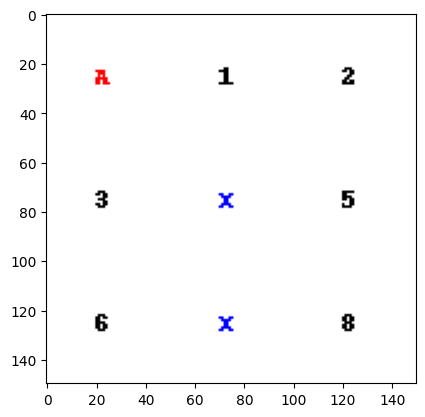

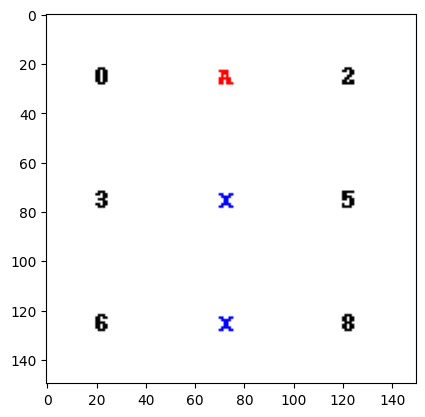

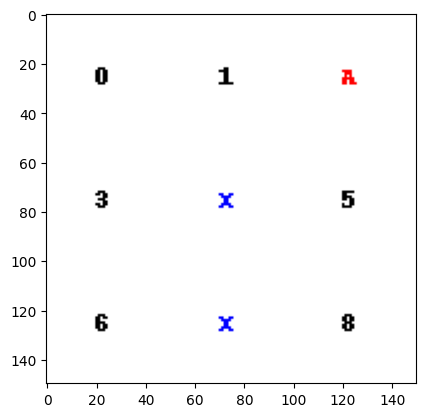

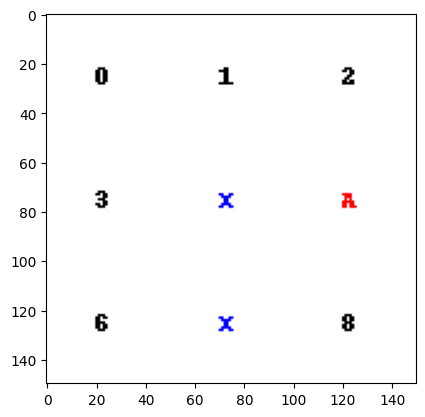

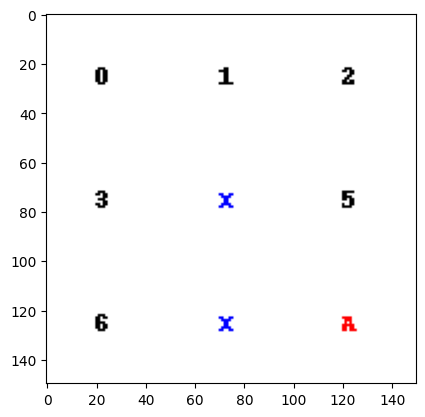

Total number of steps: 4


[(1, 2), (2, 2), (5, 1), (8, 1)]

In [52]:
render_policy(policy)

Episode generation for Monte Carlo methods

Monte Carlo methods require episodes to be generated in order to derive the value function. Therefore, you'll now implement a function that generates episodes by selecting actions randomly until an episode terminates. In later exercises, you will call this function to apply Monte Carlo methods on the custom environment env

In [53]:
print('state, info', env.reset())
print('initial state', env.unwrapped.state)
env.action_space.seed(7)
print('random action', env.action_space.sample())
print('next_state, reward, terminated, truncated, info', env.step(env.action_space.sample()))
print('current state', env.unwrapped.state)

state, info (0, {})
initial state 0
random action 3
next_state, reward, terminated, truncated, info (1, -1, False, False, {})
current state 1


In [54]:
def generate_episode(render=False):
    episode = []
    # Reset the environment
    state, info = env.reset()
    terminated = False
    if render:
            render()
    while not terminated:
        # Select a random action
        action = env.action_space.sample()
        next_state, reward, terminated, truncated, info = env.step(action)
        # Update episode data
        episode.append((state, action, reward))
        state = next_state
        if render:
            render()
    return episode

In [55]:
generate_episode() # note that when an action is requested against the perimeters, no action is executed

[(0, 2, -1),
 (1, 3, -2),
 (1, 2, -1),
 (2, 3, -2),
 (2, 3, -2),
 (2, 0, -1),
 (1, 0, -1),
 (0, 1, -1),
 (3, 1, -1),
 (6, 3, -1),
 (3, 3, -1),
 (0, 0, -2),
 (0, 1, -1),
 (3, 3, -1),
 (0, 0, -2),
 (0, 3, -2),
 (0, 0, -2),
 (0, 1, -1),
 (3, 3, -1),
 (0, 1, -1),
 (3, 1, -1),
 (6, 1, -2),
 (6, 2, -3),
 (7, 1, -2),
 (7, 3, -3),
 (4, 1, -3),
 (7, 1, -2),
 (7, 2, 10)]

Implementing first-visit Monte Carlo

The goal of Monte Carlo algorithms is to estimate the Q-table in order to derive an optimal policy. In this exercise, you will implement the First-Visit Monte Carlo method to estimate the action-value function Q, and then compute the optimal policy to solve the custom environment you've seen in the previous exercise. Whenever computing the return, assume a discount factor of 1.

In [56]:
returns_sum = np.zeros((num_states-1, num_actions))

returns_count = np.zeros((num_states-1, num_actions))

Q = np.zeros((num_states-1, num_actions))

In [57]:
for i in range(10000):
  episode = generate_episode()
  visited_states = set()
  for j, (state, action, reward) in enumerate(episode):
    # Define the first-visit condition
    if (state, action) not in visited_states:
      # Update the returns, their counts and the visited states
      # The return of a state-action pair (s, a) is the sum of rewards collected starting from s, executing a until the end.
      returns_sum[state, action] += sum([x[2] for x in episode[j:]])
      returns_count[state, action] += 1
      visited_states.add((state, action))

In [58]:
returns_sum

array([[-212493., -241244., -237786., -213890.],
       [-173096., -158364., -142884., -147824.],
       [-125766.,  -74228.,  -93593.,  -95322.],
       [-149210., -153562., -159752., -173888.],
       [-137061.,  -93632.,  -86403., -133600.],
       [ -94316.,   50160.,  -53106.,  -82704.],
       [ -98082.,  -98134.,  -89475., -129653.],
       [ -89520.,  -51848.,   49840.,  -91050.]])

In [59]:
returns_count

array([[5965., 7490., 7482., 5974.],
       [4962., 5660., 5341., 4532.],
       [4008., 4574., 3329., 3372.],
       [4536., 5366., 5809., 5042.],
       [4335., 4964., 4983., 4236.],
       [3363., 5016., 2950., 3025.],
       [3322., 3292., 4591., 4075.],
       [3056., 2971., 4984., 3282.]])

In [60]:
visited_states

{(0, 0),
 (0, 1),
 (0, 2),
 (0, 3),
 (1, 0),
 (1, 2),
 (2, 0),
 (2, 1),
 (2, 2),
 (2, 3),
 (3, 1),
 (3, 3),
 (5, 1),
 (5, 2),
 (6, 0),
 (6, 3)}

In [61]:
nonzero_counts = returns_count != 0

Q[nonzero_counts] = returns_sum[nonzero_counts] / returns_count[nonzero_counts]
Q

array([[-35.6233026 , -32.20881175, -31.78107458, -35.80348175],
       [-34.88432084, -27.9795053 , -26.75229358, -32.61782877],
       [-31.37874251, -16.22824661, -28.11444878, -28.26868327],
       [-32.89462081, -28.61759225, -27.50077466, -34.48790163],
       [-31.61730104, -18.8622079 , -17.33955449, -31.53918791],
       [-28.04519774,  10.        , -18.0020339 , -27.34016529],
       [-29.52498495, -29.80984204, -19.48921804, -31.81668712],
       [-29.29319372, -17.45136318,  10.        , -27.74223035]])

In [62]:
def get_policy(Q, num_states):
    policy = {state: np.argmax(Q[state]) for state in range(num_states-1)}
    return policy

In [63]:
policy = get_policy(Q, num_states)
policy

{0: 2, 1: 2, 2: 1, 3: 2, 4: 2, 5: 1, 6: 2, 7: 2}

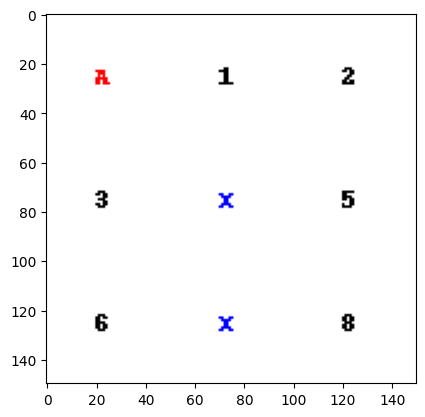

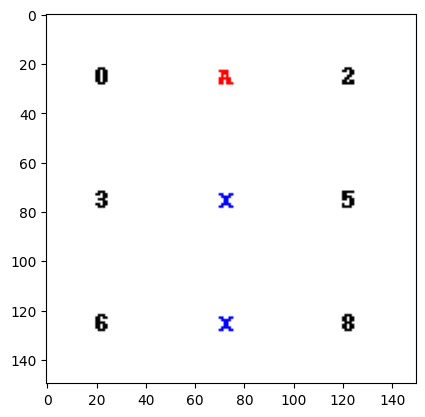

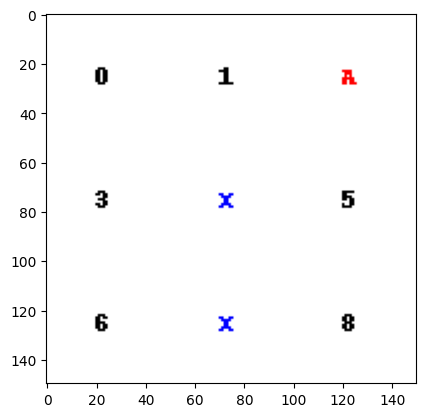

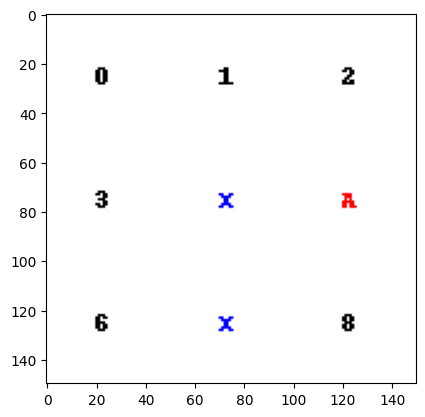

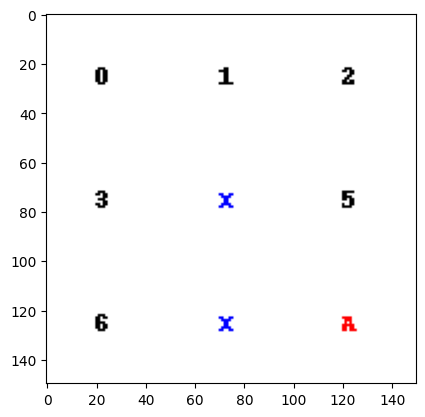

Total number of steps: 4


[(1, 2), (2, 2), (5, 1), (8, 1)]

In [64]:
render_policy(policy)

Implementing every-visit Monte Carlo

The Every-Visit Monte Carlo method differs from the First-Visit variant by updating values every time a state-action pair appears, rather than only on first encounters. While this approach provides a comprehensive evaluation of the policy by utilizing all the available information from the episodes, it may also introduce more variance in the value estimates because it includes all samples, regardless of when they occur in the episode.

In [65]:
returns_sum = np.zeros((num_states-1, num_actions))

returns_count = np.zeros((num_states-1, num_actions))

Q = np.zeros((num_states-1, num_actions))

for i in range(10000):
  # Generate an episode
  episode = generate_episode()
  # Update the returns and their counts
  for j, (state, action, reward) in enumerate(episode):
    returns_sum[(state,  action)] += sum([x[2] for x in episode[j:]])
    returns_count[(state,  action)] += 1

# Update the Q-values for visited state-action pairs 
nonzero_counts = returns_count != 0
Q[nonzero_counts] = returns_sum[nonzero_counts] / returns_count[nonzero_counts]
Q

array([[-35.75946458, -32.28631425, -31.41218111, -35.6098709 ],
       [-34.64066076, -27.61945032, -27.0519337 , -33.00796894],
       [-31.571039  , -17.32058862, -28.37295572, -28.13183978],
       [-33.56892028, -28.18999698, -28.66069992, -35.1281483 ],
       [-32.88709019, -19.98821639, -16.82079142, -31.37436099],
       [-28.41608877,  10.        , -17.98243902, -27.81242485],
       [-29.64444748, -29.22867266, -18.98793242, -31.83836351],
       [-28.7528135 , -18.30591054,  10.        , -28.6655955 ]])

In [66]:
policy = get_policy(Q, num_states)

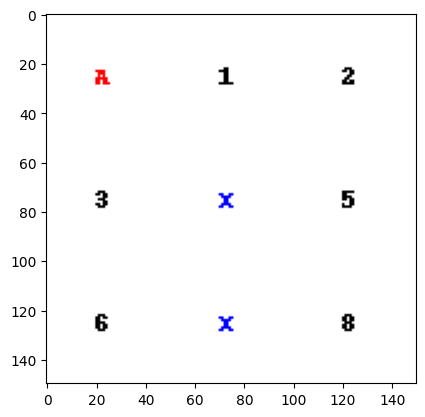

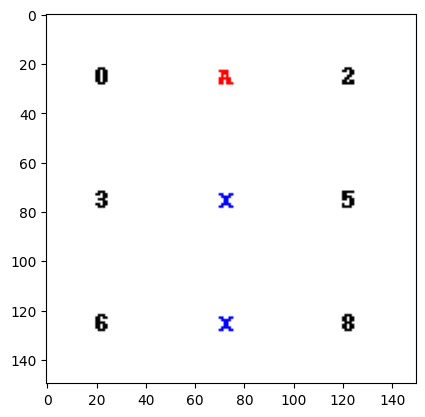

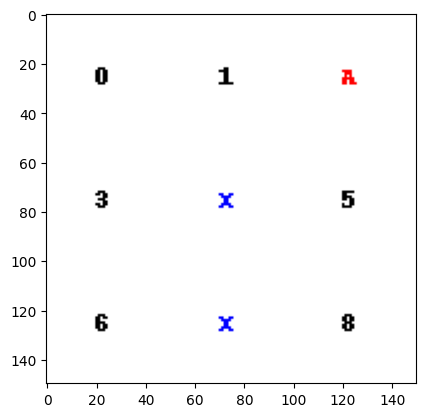

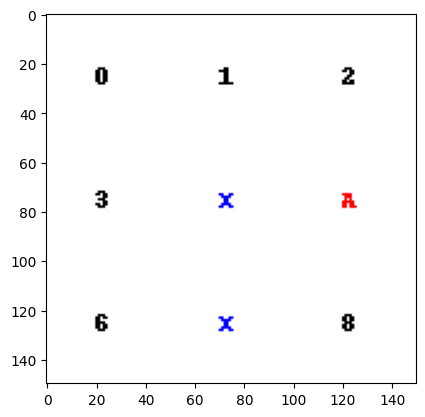

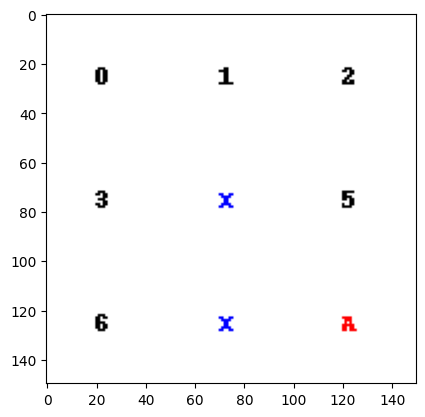

Total number of steps: 4


[(1, 2), (2, 2), (5, 1), (8, 1)]

In [67]:
render_policy(policy)

Implementing the SARSA update rule

SARSA is an on-policy algorithm in RL that updates the action-value function based on the action taken and the action selected in the next state. This method helps to learn the value of not just the current state-action pair but also the subsequent one, providing a way to learn policies that consider future actions. The SARSA update rule is below, and your task is to implement a function that updates a Q-table based on thisrule.

𝑄[𝑠, 𝑎] = (1−𝛼)*𝑄[𝑠, 𝑎] + 𝛼*target     ,     where target = reward + 𝛾*𝑄[𝑠+1, 𝑎+1]

In [68]:
def update_q_table(state, action, reward, next_state, next_action):
  	# Get the old value of the current state-action pair
    old_value = Q[state, action]
    # Get the value of the next state-action pair
    next_value = Q[next_state, next_action]
    # Compute the new value of the current state-action pair
    Q[(state, action)] = (1 - alpha) * old_value + alpha * (reward + gamma * next_value)


In [69]:
Q = np.array([[10,0],[0,20]], dtype='float32')
Q

array([[10.,  0.],
       [ 0., 20.]], dtype=float32)

In [70]:
alpha = 0.1
gamma  = 0.8
state = 0 
action = 0  
reward = 5 
next_state = 1 
next_action = 1

# Update the Q-table for the ('state=0', 'action=0') pair
update_q_table(state, action, reward, next_state, next_action)
Q

array([[11.1,  0. ],
       [ 0. , 20. ]], dtype=float32)

Solving 8x8 Frozen Lake with SARSA

In this exercise, you will apply the SARSA algorithm, incorporating the update_q_table() function you previously implemented, to learn an optimal policy for the 8x8 Frozen Lake environment. This environment is identical to the classic 4x4 one, with the only difference of being bigger. You will use the SARSA algorithm to iteratively improve the agent's policy based on the rewards received from the environment.

In [71]:
# Load the 8x8 Frozen Lake environment
env = gym.make("FrozenLake-v1", map_name="8x8", is_slippery=False, render_mode="rgb_array")
# stochastic movements (is_slippery) to handle real-world noise and uncertainty, ensuring success beyond idealized, controlled environments.
env

<TimeLimit<OrderEnforcing<PassiveEnvChecker<FrozenLakeEnv<FrozenLake-v1>>>>>

In [72]:
num_states = 8*8

Q = np.zeros((num_states,num_actions))
Q

array([[0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],


In [73]:
num_episodes = 10000

for episode in range(num_episodes):
    state, info = env.reset()
    action = env.action_space.sample()
    terminated = False
    while not terminated:
      	# Execute the action
        next_state, reward, terminated, truncated, info = env.step(action)
        # Choose the next action randomly
        next_action = env.action_space.sample()
        # Update the Q-table
        update_q_table(state, action, reward, next_state, next_action)
        state, action = next_state, next_action   


In [74]:
Q

array([[3.56295220e-07, 2.51510095e-07, 7.91951877e-07, 3.69462320e-07],
       [4.06485236e-07, 6.93744391e-07, 2.58617449e-06, 6.21897463e-07],
       [8.57483492e-07, 2.64359208e-06, 4.98067143e-06, 1.99595442e-06],
       [2.17817162e-06, 5.73992394e-06, 1.97489344e-05, 5.81690622e-06],
       [5.84339745e-06, 2.38011339e-05, 6.01690196e-05, 2.09134896e-05],
       [2.37186002e-05, 9.30074552e-05, 9.43398545e-05, 6.26461808e-05],
       [4.42696835e-05, 1.92685260e-04, 1.37440419e-04, 1.17075947e-04],
       [7.65890617e-05, 3.41399381e-04, 1.30420243e-04, 1.10373806e-04],
       [2.57238552e-07, 2.37048866e-07, 4.95607292e-07, 2.80069420e-07],
       [2.59209761e-07, 4.08808189e-07, 2.33070141e-06, 7.44287416e-07],
       [4.82883437e-07, 1.04971524e-06, 1.16986333e-05, 1.77010170e-06],
       [3.39798177e-06, 0.00000000e+00, 2.23654262e-05, 7.87039024e-06],
       [6.68950205e-06, 3.26197583e-05, 7.21910696e-05, 1.91372489e-05],
       [2.52600515e-05, 8.09432947e-05, 1.78114641e

In [75]:
policy = get_policy(Q, num_states)
policy

{0: 2,
 1: 2,
 2: 2,
 3: 2,
 4: 2,
 5: 2,
 6: 1,
 7: 1,
 8: 2,
 9: 2,
 10: 2,
 11: 2,
 12: 2,
 13: 2,
 14: 1,
 15: 1,
 16: 2,
 17: 2,
 18: 3,
 19: 0,
 20: 2,
 21: 2,
 22: 1,
 23: 1,
 24: 2,
 25: 2,
 26: 2,
 27: 2,
 28: 1,
 29: 0,
 30: 1,
 31: 1,
 32: 3,
 33: 2,
 34: 3,
 35: 0,
 36: 2,
 37: 2,
 38: 2,
 39: 1,
 40: 3,
 41: 0,
 42: 0,
 43: 0,
 44: 3,
 45: 3,
 46: 0,
 47: 1,
 48: 3,
 49: 0,
 50: 1,
 51: 0,
 52: 0,
 53: 3,
 54: 0,
 55: 1,
 56: 3,
 57: 0,
 58: 0,
 59: 0,
 60: 0,
 61: 3,
 62: 2}

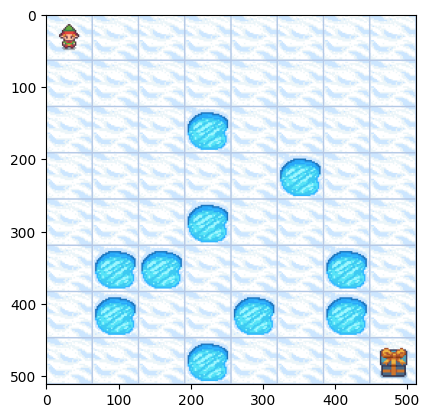

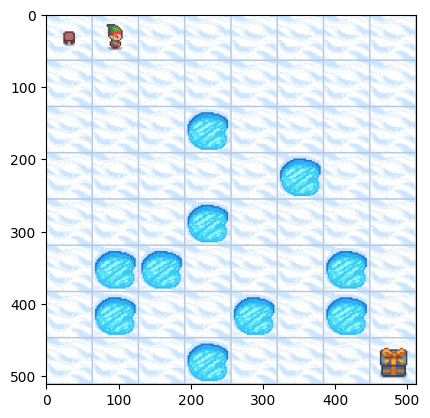

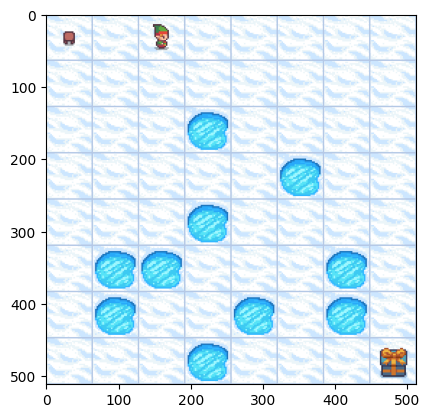

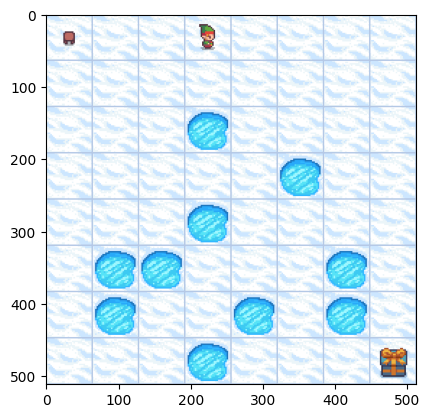

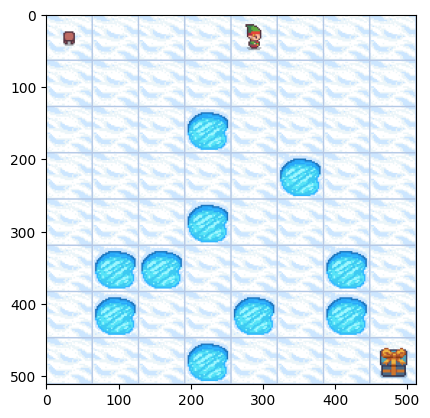

...

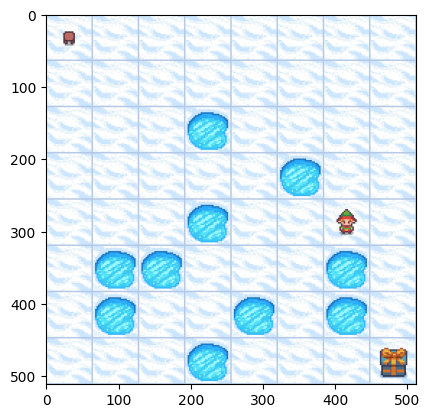

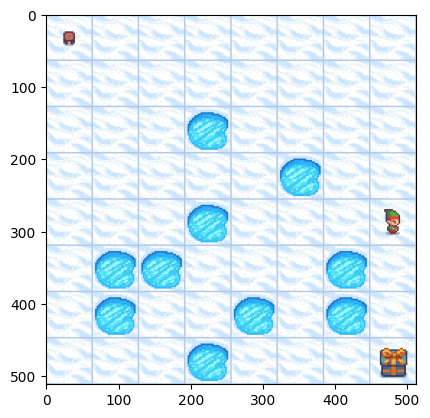

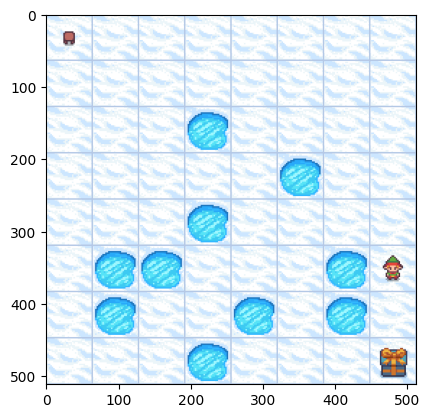

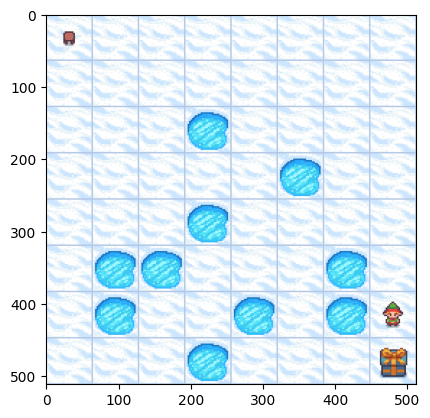

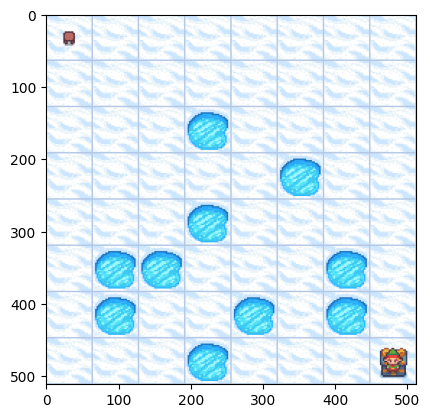

Total number of steps: 14


[(1, 2),
 (2, 2),
 (3, 2),
 (4, 2),
 (5, 2),
 (6, 2),
 (14, 1),
 (22, 1),
 (30, 1),
 (38, 1),
 (39, 2),
 (47, 1),
 (55, 1),
 (63, 1)]

In [76]:
render_policy(policy)

Implementing Q-learning update rule

Q-learning is an off-policy algorithm in reinforcement learning (RL) that seeks to find the best action to take given the current state. Unlike SARSA, which considers the actual next action taken, Q-learning updates its Q-values using the maximum future reward irrespective of the action taken. This distinction allows Q-learning to learn the optimal policy while following an exploratory or even a random policy. Here's the task to implement a function that updates a Q-table based on the Q-learning rule. The Q-learning update rule is below, and your task is to implement a function that updates a Q-table based on this rule.

 Q[s, a] = (1 - α)*Q[s, a] + α*Qtarget      ,     where Qtarget = reward + γ*max(Q[s+1, all actions])

In [77]:
def update_q_table(state, action, reward, next_state):
  	# Get the old value of the current state-action pair
    old_value = Q[state, action]
    # Determine the maximum Q-value for the next state
    next_max = max(Q[next_state])
    # Compute the new value of the current state-action pair
    Q[state, action] = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)


In [78]:
# actions = ['action1', 'action2'] 
alpha = 0.1
gamma = 0.95
Q = np.array([[10, 8], [20, 15]], dtype='float32')
Q

array([[10.,  8.],
       [20., 15.]], dtype=float32)

In [79]:
# Update the Q-table
update_q_table(0, 0, 5, 1)
Q

array([[11.4,  8. ],
       [20. , 15. ]], dtype=float32)

Solving 8x8 Frozen Lake with Q-learning

In this exercise, you'll apply the Q-learning algorithm to learn an optimal policy for navigating through the 8x8 Frozen Lake environment, this time with the "slippery" condition enabled. The challenge introduces stochastic transitions, making the agent's movement unpredictable and thus more closely simulating real-world scenarios.

In [80]:
# Load the 8x8 Frozen Lake environment
env = gym.make("FrozenLake-v1", map_name="8x8", is_slippery=True, render_mode="rgb_array")
# stochastic movements (is_slippery) to handle real-world noise and uncertainty, ensuring success beyond idealized, controlled environments.
env

<TimeLimit<OrderEnforcing<PassiveEnvChecker<FrozenLakeEnv<FrozenLake-v1>>>>>

In [81]:
Q = np.zeros((num_states,num_actions))
Q.shape

(64, 4)

In [82]:
rewards_per_episode = []
for episode in range(10000):
    state, info = env.reset()
    total_reward = 0
    terminated = False
    while not terminated:
        action = env.action_space.sample()
        # Execute the action
        next_state, reward, terminated, truncated, info = env.step(action)
        # Update the Q-table
        update_q_table(state, action, reward, next_state)
        state = next_state
        total_reward += reward
    # Append the total reward to the rewards list    
    rewards_per_episode.append(total_reward)

In [83]:
avg_reward_per_random_episode = np.mean(rewards_per_episode)
print("Average reward per random episode: ", avg_reward_per_random_episode)
[elem for elem in rewards_per_episode if elem > 0]

Average reward per random episode:  0.0016


[1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0]

In [84]:
policy = get_policy(Q, num_states)
policy

{0: 1,
 1: 2,
 2: 2,
 3: 2,
 4: 1,
 5: 2,
 6: 2,
 7: 0,
 8: 3,
 9: 3,
 10: 3,
 11: 3,
 12: 2,
 13: 2,
 14: 1,
 15: 1,
 16: 3,
 17: 3,
 18: 0,
 19: 0,
 20: 2,
 21: 3,
 22: 2,
 23: 0,
 24: 0,
 25: 3,
 26: 3,
 27: 3,
 28: 0,
 29: 0,
 30: 2,
 31: 1,
 32: 3,
 33: 3,
 34: 3,
 35: 0,
 36: 1,
 37: 1,
 38: 3,
 39: 2,
 40: 3,
 41: 0,
 42: 0,
 43: 2,
 44: 0,
 45: 0,
 46: 0,
 47: 1,
 48: 2,
 49: 0,
 50: 2,
 51: 0,
 52: 0,
 53: 2,
 54: 0,
 55: 0,
 56: 3,
 57: 0,
 58: 1,
 59: 0,
 60: 0,
 61: 3,
 62: 0}

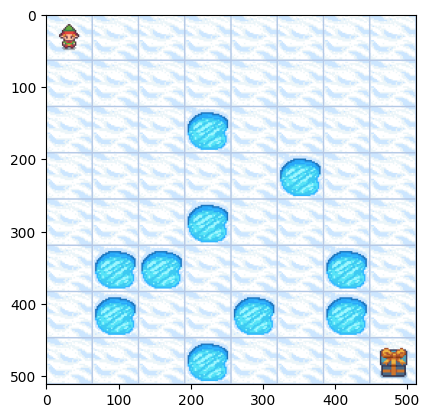

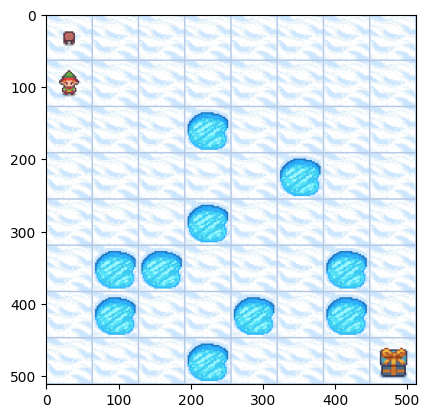

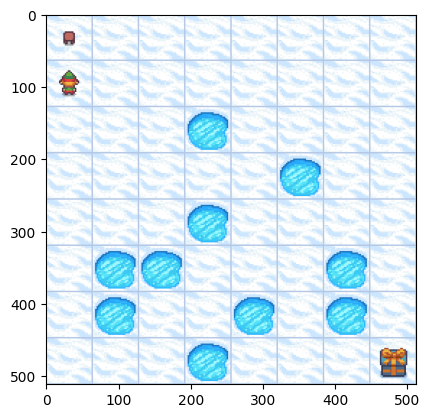

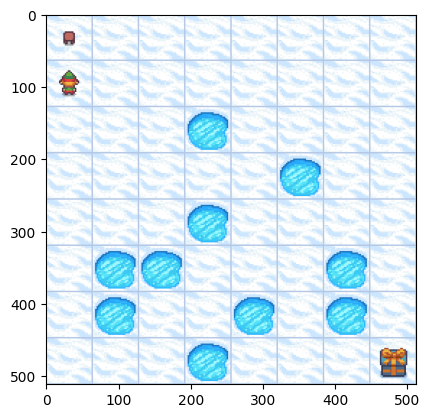

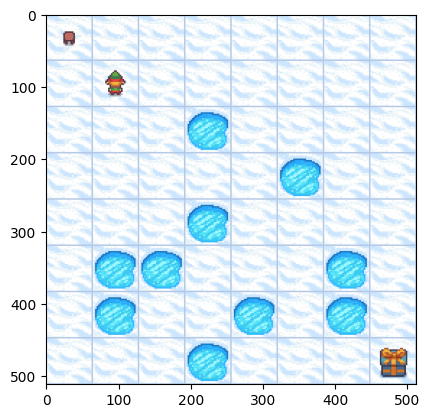

...

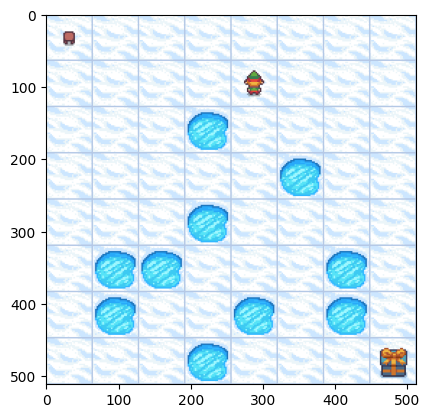

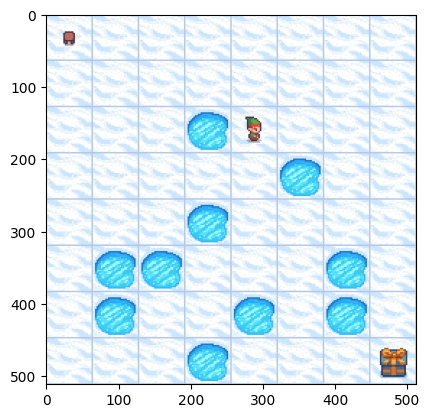

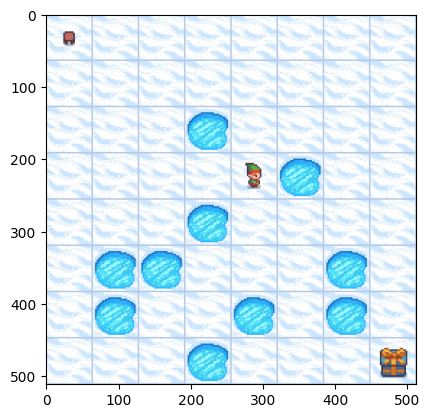

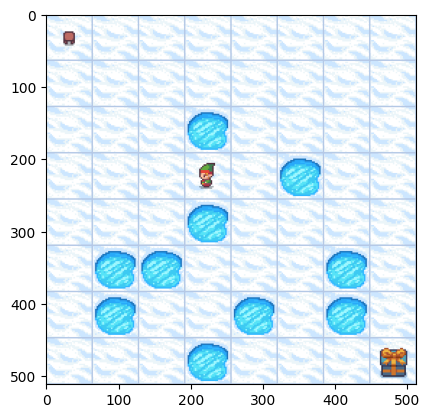

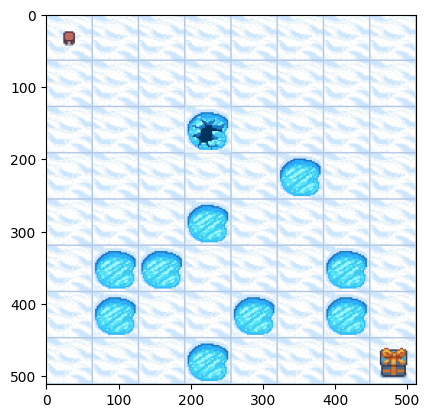

Total number of steps: 26


[(8, 1),
 (8, 3),
 (8, 3),
 (9, 3),
 (1, 3),
 (1, 2),
 (2, 2),
 (10, 2),
 (9, 3),
 (1, 3),
 (9, 2),
 (1, 3),
 (1, 2),
 (1, 2),
 (1, 2),
 (1, 2),
 (2, 2),
 (10, 2),
 (2, 3),
 (3, 2),
 (11, 2),
 (12, 3),
 (20, 2),
 (28, 2),
 (27, 0),
 (19, 3)]

In [85]:
render_policy(policy, to_render=True)

Evaluating policy on a slippery Frozen Lake

In a slippery Frozen Lake environment, merely deducing the policy from a learned Q-table isn't sufficient to gauge its effectiveness. To accurately assess the suitability of a learned policy, you must play multiple episodes, observing the average reward achieved. This exercise compares the effectiveness of the learned policy against a baseline established by following a random policy during training. Your task is to execute the learned policy over several episodes and analyze its performance based on the average rewards collected, contrasting it with the average rewards collected during the random policy phase.

In [86]:
reward_per_learned_episode = []

for episode in range(10000):
    state, info = env.reset()
    terminated = False
    episode_reward = 0
    while not terminated:
        # Select the best action based on learned Q-table
        action = np.argmax(Q[state])
        next_state, reward, terminated, truncated, info = env.step(action)
        # Update the Q-table
        update_q_table(state, action, reward, next_state)
        state = next_state
        episode_reward += reward
    reward_per_learned_episode.append(reward)

In [87]:
# Compute and print the average reward per learned episode
avg_reward_per_learned_episode = np.mean(reward_per_learned_episode)
print("Average reward per learned episode: ", avg_reward_per_learned_episode)
print("Average reward per random episode: ", avg_reward_per_random_episode)

# By comparing the average reward from the learned policy to that achieved with a random policy, 
# you've quantitatively assessed the improvement brought by applying Q-learning.

Average reward per learned episode:  0.6263
Average reward per random episode:  0.0016


In [88]:
policy = get_policy(Q, num_states)
policy

{0: 2,
 1: 2,
 2: 2,
 3: 2,
 4: 2,
 5: 2,
 6: 2,
 7: 2,
 8: 3,
 9: 2,
 10: 3,
 11: 3,
 12: 2,
 13: 2,
 14: 2,
 15: 1,
 16: 3,
 17: 3,
 18: 0,
 19: 0,
 20: 2,
 21: 3,
 22: 2,
 23: 1,
 24: 3,
 25: 3,
 26: 3,
 27: 3,
 28: 0,
 29: 0,
 30: 2,
 31: 1,
 32: 3,
 33: 3,
 34: 3,
 35: 0,
 36: 1,
 37: 1,
 38: 3,
 39: 2,
 40: 3,
 41: 0,
 42: 0,
 43: 2,
 44: 2,
 45: 0,
 46: 0,
 47: 2,
 48: 2,
 49: 0,
 50: 2,
 51: 0,
 52: 0,
 53: 2,
 54: 0,
 55: 2,
 56: 3,
 57: 0,
 58: 1,
 59: 0,
 60: 0,
 61: 3,
 62: 0}

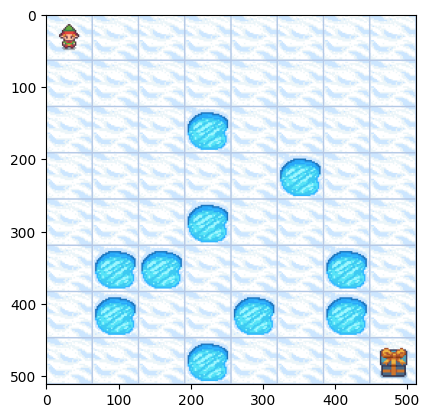

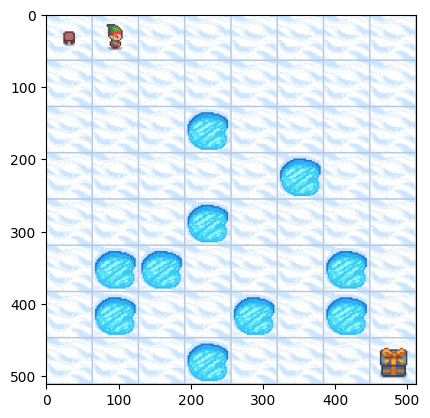

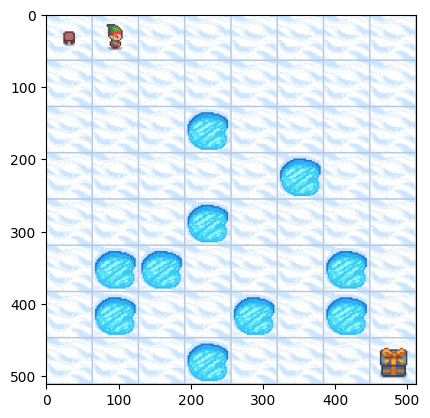

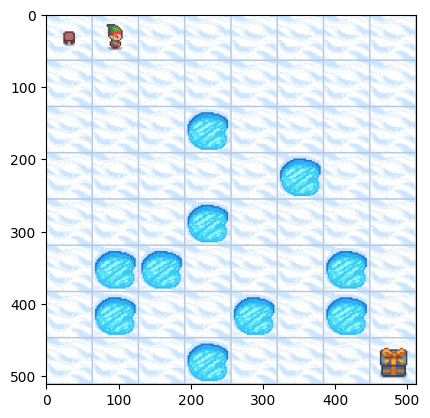

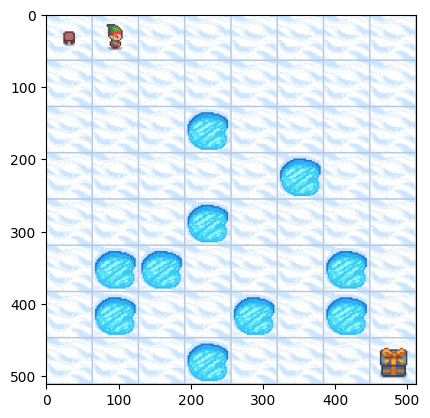

...

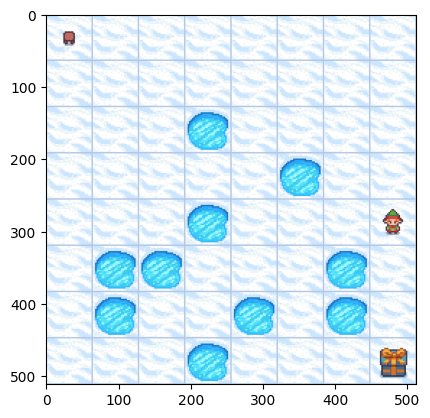

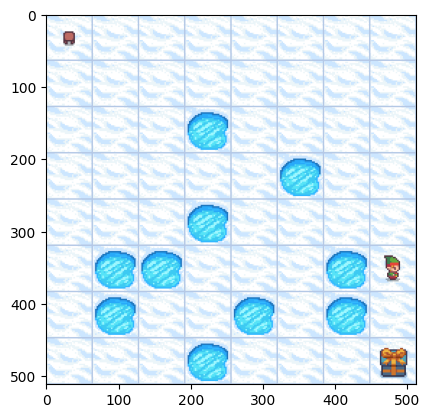

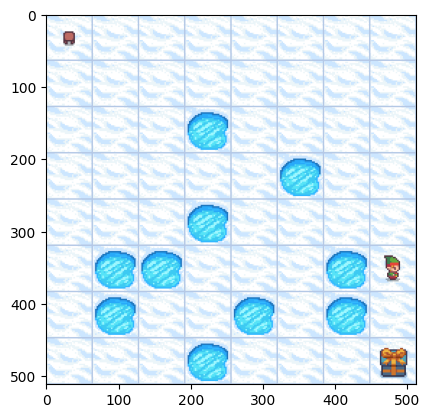

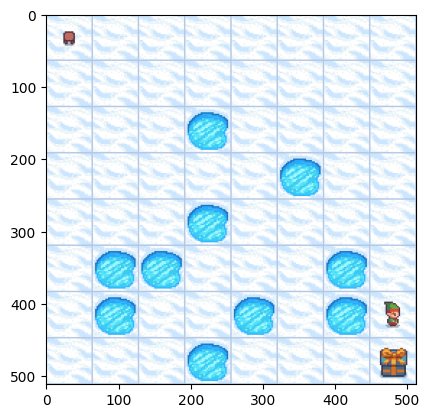

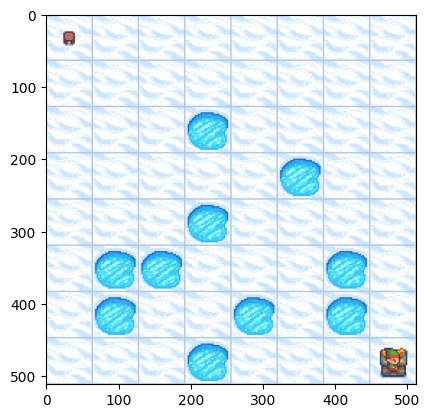

Total number of steps: 71


[(1, 2),
 (1, 2),
 (1, 2),
 (1, 2),
 (2, 2),
 (3, 2),
 (11, 2),
 (10, 3),
 (2, 3),
 (2, 2),
 (2, 2),
 (2, 2),
 (2, 2),
 (2, 2),
 (2, 2),
 (2, 2),
 (10, 2),
 (11, 3),
 (3, 3),
 (11, 2),
 (12, 3),
 (13, 2),
 (14, 2),
 (6, 2),
 (7, 2),
 (15, 2),
 (14, 1),
 (6, 2),
 (7, 2),
 (15, 2),
 (15, 1),
 (23, 1),
 (31, 1),
 (31, 1),
 (39, 1),
 (47, 2),
 (47, 2),
 (47, 2),
 (55, 2),
 (47, 2),
 (39, 2),
 (31, 2),
 (30, 1),
 (22, 2),
 (23, 2),
 (22, 1),
 (14, 2),
 (6, 2),
 (6, 2),
 (14, 2),
 (15, 2),
 (15, 1),
 (23, 1),
 (22, 1),
 (30, 2),
 (38, 2),
 (37, 3),
 (38, 1),
 (39, 3),
 (31, 2),
 (39, 1),
 (47, 2),
 (39, 2),
 (39, 2),
 (31, 2),
 (31, 1),
 (39, 1),
 (47, 2),
 (47, 2),
 (55, 2),
 (63, 2)]

In [89]:
render_policy(policy)

Expected SARSA update rule

In this exercise, you'll implement the Expected SARSA update rule, a temporal difference model-free RL algorithm. Expected SARSA estimates the expected value of the current policy by averaging over all possible actions, providing a more stable update target compared to SARSA. The formulas used in Expected SARSA can be found below.

 Q[s, a] = (1 - α)*Q[s, a] + α*Qtarget      ,     where Qtarget = reward + γ*E(Q[s+1, all actions])

In [90]:
def update_q_table(state, action, next_state, reward):
    # Calculate the expected Q-value for the next state
    expected_q = np.mean(Q[next_state])
    # Update the Q-value for the current state and action
    Q[state, action] = (1-alpha) * Q[state, action] + alpha * (reward + gamma * expected_q)


In [91]:
alpha = 0.1
gamma = 0.99

Q = np.random.rand(5, 2)
print("Old Q:\n", Q)

Old Q:
 [[0.17567777 0.71944799]
 [0.57313105 0.69022076]
 [0.81238    0.85829655]
 [0.64569137 0.86675843]
 [0.35441778 0.57807466]]


In [92]:
# Update the Q-table
update_q_table(state=2, action=1, next_state=3, reward=5)
print("Updated Q:\n", Q)

Updated Q:
 [[0.17567777 0.71944799]
 [0.57313105 0.69022076]
 [0.81238    1.34733316]
 [0.64569137 0.86675843]
 [0.35441778 0.57807466]]


In [93]:
# Applying Expected SARSA to the custom environment

# Create the environment
env = gym.make('MyGridWorld-v0', render_mode='rgb_array')
env

<OrderEnforcing<PassiveEnvChecker<MyGridWorld<MyGridWorld-v0>>>>

In [94]:
env.observation_space.n, env.action_space.n

(9, 4)

In [95]:
# Initialize the Q-table with random values
Q = np.zeros((env.observation_space.n, env.action_space.n))
Q

array([[0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]])

In [96]:
num_episodes

10000

In [97]:
for i_episode in range(num_episodes):
    state, info = env.reset()    
    done = False    
    while not done: 
        action = env.action_space.sample()               
        next_state, reward, done, truncated, info = env.step(action)
        # Update the Q-table
        update_q_table(state, action, next_state, reward)
        state = next_state

In [98]:
Q

array([[-29.80537573, -26.60498884, -26.12921214, -29.80537573],
       [-28.80537573, -23.28063069, -22.3169517 , -27.12921214],
       [-26.12921214, -13.36598225, -23.3169517 , -23.3169517 ],
       [-27.60498884, -23.7635051 , -23.28063069, -28.80537573],
       [-26.60498884, -15.84175895, -13.36598225, -26.12921214],
       [-23.28063069,  10.        , -14.36598225, -22.3169517 ],
       [-24.7635051 , -24.7635051 , -15.84175895, -26.60498884],
       [-23.7635051 , -14.84175895,  10.        , -23.28063069],
       [  0.        ,   0.        ,   0.        ,   0.        ]])

In [99]:
# Derive policy from Q-table        
policy = {state: np.argmax(Q[state]) for state in range(env.observation_space.n -1)}
policy

{0: 2, 1: 2, 2: 1, 3: 2, 4: 2, 5: 1, 6: 2, 7: 2}

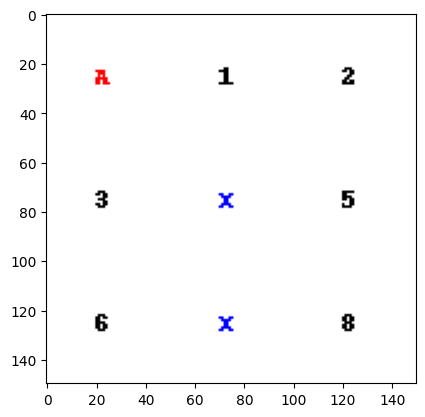

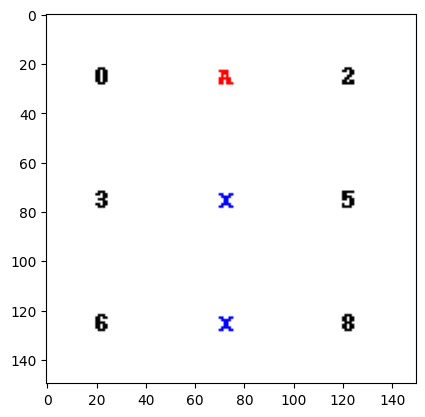

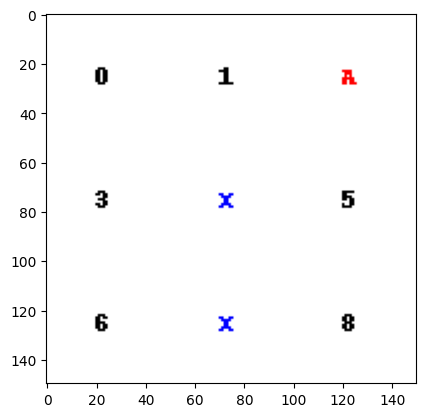

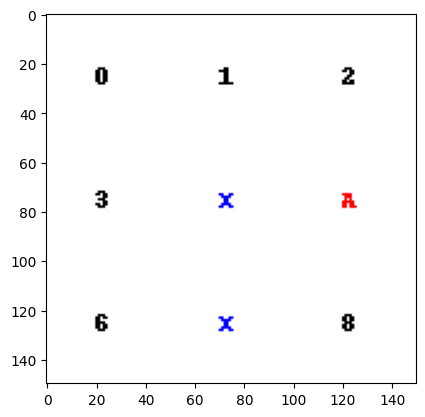

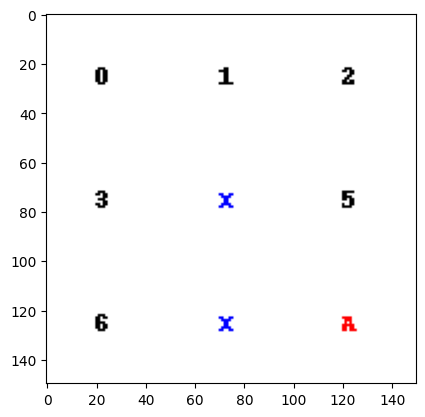

Total number of steps: 4


[(1, 2), (2, 2), (5, 1), (8, 1)]

In [100]:
render_policy(policy)

Implementing double Q-learning update rule

Double Q-learning is an extension of the Q-learning algorithm that helps to reduce overestimation of action values by maintaining and updating two separate Q-tables. By decoupling the action selection from the action evaluation, Double Q-learning provides a more accurate estimation of the Q-values. This exercise guides you through implementing the Double Q-learning update rule.

In [101]:
gamma = 0.99
alpha = 0.2

Q = [np.random.rand(8,4), np.random.rand(8,4)] 
Q

[array([[0.22072616, 0.29785056, 0.16898993, 0.67922501],
        [0.93952495, 0.84304446, 0.26569256, 0.1475836 ],
        [0.85475473, 0.62866481, 0.39354448, 0.64318863],
        [0.52181688, 0.22469341, 0.97535315, 0.82280688],
        [0.22577574, 0.29539152, 0.51869534, 0.4404539 ],
        [0.0354376 , 0.23183936, 0.73408846, 0.64853794],
        [0.85376421, 0.85921025, 0.70031944, 0.92541976],
        [0.62307789, 0.23571128, 0.37944507, 0.07356948]]),
 array([[0.55625596, 0.62448067, 0.0794722 , 0.13275247],
        [0.96692649, 0.12078972, 0.07595976, 0.79554725],
        [0.18187019, 0.46679711, 0.11339691, 0.8639522 ],
        [0.40248546, 0.77686344, 0.31065849, 0.25057137],
        [0.18447619, 0.61326727, 0.89063347, 0.60766958],
        [0.43107886, 0.23988751, 0.57880763, 0.58414532],
        [0.75333092, 0.85950394, 0.90033843, 0.09524279],
        [0.03550054, 0.4884516 , 0.65179312, 0.94833347]])]

In [102]:
def update_q_tables(state, action, reward, next_state):
  	# Get the index of the table to update
    i = np.random.randint(2)
    # Update Q[i]
    best_next_action = np.argmax(Q[i][next_state])
    Q[i][state, action] = (1 - alpha) * Q[i][state, action] + alpha * (reward + gamma * Q[1-i][next_state, best_next_action])

Applying double Q-learning

This exercise tasks you with applying the Double Q-learning algorithm in the same custom environment you solved with Expected SARSA. Double Q-learning, by using two Q-tables, helps reduce the overestimation bias inherent in the traditional Q-learning algorithm and offers more stability in learning than other temporal difference methods. You'll use this method to navigate through the grid environment, aiming for the highest reward while avoiding obstacles in order to reach the goal as quickly as possible.

In [103]:
Q = [np.zeros((env.observation_space.n, env.action_space.n))] * 2
Q

[array([[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]]),
 array([[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]])]

In [104]:
for episode in range(num_episodes):
    state, info = env.reset()
    terminated = False   
    while not terminated:
        action = np.random.choice(env.action_space.n)
        next_state, reward, terminated, truncated, info = env.step(action)
        # Update the Q-tables
        update_q_tables(state, action, reward, next_state) 
        state = next_state
Q

[array([[ 4.6655611,  4.77269  ,  6.73289  ,  4.6655611],
        [ 5.6655611,  5.811    ,  7.811    ,  5.73289  ],
        [ 6.73289  ,  8.9      ,  6.811    ,  6.811    ],
        [ 3.77269  ,  5.831    ,  5.811    ,  5.6655611],
        [ 4.77269  ,  6.9      ,  8.9      ,  6.73289  ],
        [ 5.811    , 10.       ,  7.9      ,  7.811    ],
        [ 4.831    ,  4.831    ,  6.9      ,  4.77269  ],
        [ 5.831    ,  7.9      , 10.       ,  5.811    ],
        [ 0.       ,  0.       ,  0.       ,  0.       ]]),
 array([[ 4.6655611,  4.77269  ,  6.73289  ,  4.6655611],
        [ 5.6655611,  5.811    ,  7.811    ,  5.73289  ],
        [ 6.73289  ,  8.9      ,  6.811    ,  6.811    ],
        [ 3.77269  ,  5.831    ,  5.811    ,  5.6655611],
        [ 4.77269  ,  6.9      ,  8.9      ,  6.73289  ],
        [ 5.811    , 10.       ,  7.9      ,  7.811    ],
        [ 4.831    ,  4.831    ,  6.9      ,  4.77269  ],
        [ 5.831    ,  7.9      , 10.       ,  5.811    ],
        [ 0.

In [105]:
# Combine the learned Q-tables        
Q = Q[0] + Q[1]
Q

array([[ 9.3311222,  9.54538  , 13.46578  ,  9.3311222],
       [11.3311222, 11.622    , 15.622    , 11.46578  ],
       [13.46578  , 17.8      , 13.622    , 13.622    ],
       [ 7.54538  , 11.662    , 11.622    , 11.3311222],
       [ 9.54538  , 13.8      , 17.8      , 13.46578  ],
       [11.622    , 20.       , 15.8      , 15.622    ],
       [ 9.662    ,  9.662    , 13.8      ,  9.54538  ],
       [11.662    , 15.8      , 20.       , 11.622    ],
       [ 0.       ,  0.       ,  0.       ,  0.       ]])

In [106]:
policy = {state: np.argmax(Q[state]) for state in range(env.observation_space.n -1)}
policy

{0: 2, 1: 2, 2: 1, 3: 1, 4: 2, 5: 1, 6: 2, 7: 2}

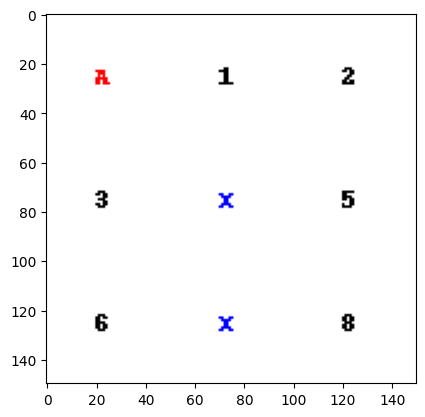

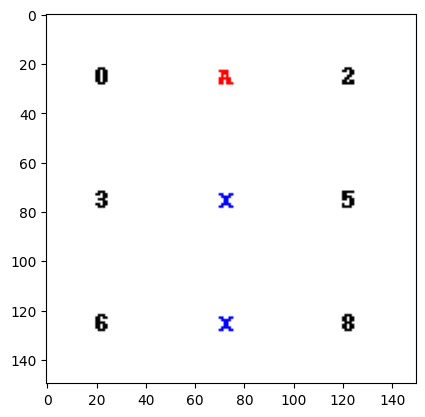

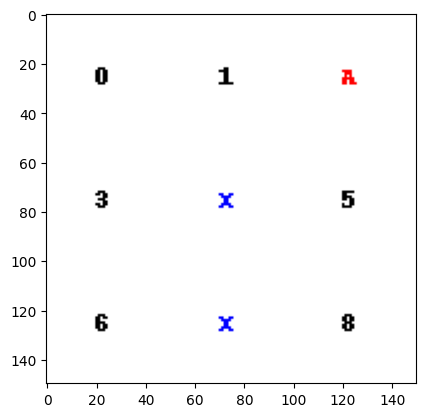

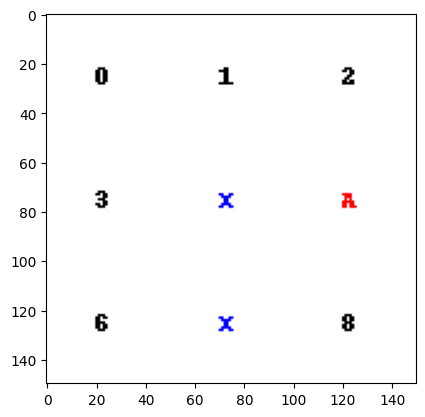

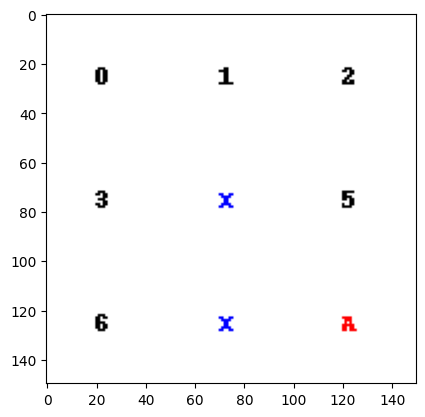

Total number of steps: 4


[(1, 2), (2, 2), (5, 1), (8, 1)]

In [107]:
render_policy(policy)

Defining epsilon-greedy function

In RL, the epsilon-greedy strategy is a balance between exploration and exploitation. This method chooses a random action with probability epsilon and the best-known action with probability 1-epsilon. Implementing the epsilon_greedy() function is crucial for algorithms like Q-learning and SARSA, facilitating the agent's learning process by ensuring both exploration of the environment and exploitation of known rewards, and this will be the goal of this exercise.

In [108]:
def epsilon_greedy(q_table, state, epsilon):
    # Implement the condition to explore
    if np.random.rand() < epsilon:
      	# Choose a random action
        action = env.action_space.sample()
    else:
      	# Choose the best action according to q_table
        action = np.argmax(q_table[state])
    return action

In [109]:
env = gym.make('FrozenLake-v1')
env

<TimeLimit<OrderEnforcing<PassiveEnvChecker<FrozenLakeEnv<FrozenLake-v1>>>>>

In [110]:
q_table = np.random.rand(env.observation_space.n, env.action_space.n)
q_table

array([[0.96484003, 0.52232001, 0.67019498, 0.52048618],
       [0.9331134 , 0.90922865, 0.24773675, 0.62846845],
       [0.16610716, 0.69280194, 0.65685481, 0.71381233],
       [0.97808386, 0.27561453, 0.61968697, 0.94745833],
       [0.47345023, 0.8387554 , 0.4226394 , 0.02079525],
       [0.56409479, 0.77215424, 0.31446373, 0.39970612],
       [0.25818313, 0.12247156, 0.93588734, 0.97533735],
       [0.35882532, 0.6051814 , 0.08219437, 0.93017298],
       [0.24166825, 0.01666459, 0.14147803, 0.33234255],
       [0.77222864, 0.27523847, 0.74273523, 0.39171796],
       [0.42088319, 0.06719307, 0.29313074, 0.20767716],
       [0.51153332, 0.54576314, 0.45875889, 0.52383803],
       [0.67350123, 0.11314628, 0.13317541, 0.76998899],
       [0.64138129, 0.09642104, 0.03426619, 0.96306777],
       [0.193206  , 0.76767049, 0.39506442, 0.68707198],
       [0.43492553, 0.13466442, 0.98801579, 0.70988417]])

Solving CliffWalking with epsilon greedy strategy

The CliffWalking environment is a standard testbed for RL algorithms. It's a grid world where an agent must find a path from a start state to a goal state, avoiding cliffs along the way. Using the epsilon-greedy strategy allows the agent to explore the environment effectively while learning to avoid cliffs, maximizing the cumulative reward. Your task is to solve this environment using the epsilon-greedy strategy, compute the rewards attained in each training episode, and save them to the rewards_eps_greedy list.

In [111]:
env = gym.make("CliffWalking-v0", render_mode="rgb_array")
env

<OrderEnforcing<PassiveEnvChecker<CliffWalkingEnv<CliffWalking-v0>>>>

In [112]:
total_episodes = 10000
max_steps = 100
epsilon = 0.9

In [113]:
Q = np.zeros((env.observation_space.n, env.action_space.n))
Q.shape

(48, 4)

In [114]:
# using a fix epsilon

rewards_eps_greedy = []
for episode in range(total_episodes):
    state, info = env.reset()
    episode_reward = 0
    for i in range(env.observation_space.n):
      	# Select action with epsilon-greedy strategy
        action = epsilon_greedy(Q, state, epsilon)
        next_state, reward, terminated, truncated, info = env.step(action)
        # Accumulate reward
        episode_reward  += reward        
        update_q_table(state, action, next_state, reward)      
        state = next_state
    # Append the toal reward to the rewards list 
    rewards_eps_greedy.append(episode_reward)

Q

array([[ -909.44582554,  -913.32397017,  -938.30010698,  -909.44744169],
       [ -913.31496897,  -915.78846402,  -947.66293494,  -909.44054986],
       [ -915.78886268,  -914.35922045,  -952.73352329,  -913.3131401 ],
       [ -914.3653931 ,  -907.8891338 ,  -952.63246617,  -915.75240934],
       [ -907.84531449,  -894.85664798,  -947.55375317,  -914.32112617],
       [ -894.78100173,  -873.05154387,  -936.52700065,  -907.76667948],
       [ -872.65404157,  -840.13013614,  -916.73343224,  -894.60984192],
       [ -839.21309268,  -791.57397656,  -887.95720761,  -872.62512116],
       [ -789.79351405,  -727.73453357,  -841.63023086,  -838.27711844],
       [ -722.59427012,  -654.2591769 ,  -776.93805455,  -789.95734106],
       [ -652.55742559,  -607.27697801,  -685.43395031,  -724.70785189],
       [ -604.36139877,  -601.38994459,  -630.61880935,  -647.87677747],
       [ -909.44631811,  -947.66573563,  -991.69891071,  -938.2957297 ],
       [ -913.32563349,  -952.71153182, -1020.64718

In [115]:
print("Average reward per episode: ", np.mean(rewards_eps_greedy))

Average reward per episode:  -367.077


In [116]:
policy = {state: np.argmax(Q[state]) for state in range(env.observation_space.n -1)}
policy

{0: 0,
 1: 3,
 2: 3,
 3: 1,
 4: 1,
 5: 1,
 6: 1,
 7: 1,
 8: 1,
 9: 1,
 10: 1,
 11: 1,
 12: 0,
 13: 0,
 14: 0,
 15: 0,
 16: 0,
 17: 0,
 18: 0,
 19: 0,
 20: 1,
 21: 1,
 22: 1,
 23: 0,
 24: 0,
 25: 0,
 26: 0,
 27: 0,
 28: 0,
 29: 0,
 30: 0,
 31: 0,
 32: 0,
 33: 0,
 34: 1,
 35: 0,
 36: 0,
 37: 0,
 38: 0,
 39: 0,
 40: 0,
 41: 0,
 42: 0,
 43: 0,
 44: 0,
 45: 0,
 46: 0}

In [117]:
# render_policy(policy) # the agent get stuck without reaching the destination, because the large negative reward

In [118]:
Q = np.zeros((env.observation_space.n, env.action_space.n))
Q.shape

(48, 4)

In [119]:
# using epsilon decay
min_epsilon = 0.01
epsilon_decay = 0.999

rewards_decay_eps_greedy = []
for episode in range(total_episodes):
    state, info = env.reset()
    episode_reward = 0
    for i in range(env.observation_space.n):
      	# Select action with epsilon-greedy strategy
        action = epsilon_greedy(Q, state, epsilon)
        next_state, reward, terminated, truncated, info = env.step(action)
        # Accumulate reward
        episode_reward  += reward        
        update_q_table(state, action, next_state, reward)      
        state = next_state
    # Append the toal reward to the rewards list 
    rewards_decay_eps_greedy.append(episode_reward)
    # Update epsilon
    epsilon = max(min_epsilon, epsilon * epsilon_decay)
    
Q.shape

(48, 4)

In [120]:
print("Average reward per episode: ", np.mean(rewards_decay_eps_greedy))

Average reward per episode:  -59.1771


In [121]:
policy = {state: np.argmax(Q[state]) for state in range(env.observation_space.n -1)}
policy

{0: 1,
 1: 1,
 2: 1,
 3: 1,
 4: 1,
 5: 1,
 6: 1,
 7: 1,
 8: 1,
 9: 1,
 10: 1,
 11: 0,
 12: 0,
 13: 1,
 14: 1,
 15: 1,
 16: 1,
 17: 0,
 18: 1,
 19: 1,
 20: 0,
 21: 0,
 22: 0,
 23: 0,
 24: 0,
 25: 0,
 26: 0,
 27: 0,
 28: 0,
 29: 0,
 30: 1,
 31: 1,
 32: 3,
 33: 0,
 34: 0,
 35: 0,
 36: 0,
 37: 0,
 38: 0,
 39: 0,
 40: 0,
 41: 0,
 42: 0,
 43: 0,
 44: 0,
 45: 0,
 46: 0}

In [122]:
# render_policy(policy) # the agent get stuck without reaching the destination, but progresses further in the map

Creating a multi-armed bandit

A multi-armed bandit problem is a classic example used in reinforcement learning to describe a scenario where an agent must choose between multiple actions (or "arms") without knowing the expected reward of each. Over time, the agent learns which arm yields the highest reward by exploring each option. This exercise involves setting up the foundational structure for simulating a multi-armed bandit problem.

In [123]:
def create_multi_armed_bandit(n_bandits):
    # Generate the true bandits probabilities
    true_bandit_probs = np.random.rand(n_bandits) 
    # Create arrays that store the count and value for each bandit
    counts = np.zeros(n_bandits)  
    values = np.zeros(n_bandits)  
    # Create arrays that store the rewards and selected arms each episode
    rewards = np.zeros(n_iterations)
    selected_arms = np.zeros(n_iterations, dtype=int)  
    return true_bandit_probs, counts, values, rewards, selected_arms

Solving a multi-armed 

This exercise involves implementing an epsilon-greedy strategy to solve a 10-armed bandit problem, where the epsilon value decays over time to shift from exploration to exploitation.

In [125]:
n_iterations = 1000
epsilon = 1
min_epsilon = 0.01 
epsilon_decay = 0.999

In [126]:
n_bandits = 10

# Create a 10-armed bandit
true_bandit_probs, counts, values, rewards, selected_arms = create_multi_armed_bandit(n_bandits)
true_bandit_probs, counts.shape, values.shape, rewards.shape, selected_arms.shape

(array([0.66919495, 0.62658511, 0.23121388, 0.8825248 , 0.01798865,
        0.9198558 , 0.39600797, 0.37368945, 0.0289207 , 0.57505142]),
 (10,),
 (10,),
 (1000,),
 (1000,))

In [127]:
def epsilon_greedy():
    """Selects an arm using the epsilon-greedy strategy."""
    if np.random.rand() < epsilon:
        return np.random.randint(len(values))  # Explore
    else:
        return np.argmax(values)  # Exploit

In [128]:
epsilon_greedy()

7

In [129]:
# Main loop for the bandit problem

for i in range(n_iterations):
    # Step 1: Select an arm using the epsilon-greedy strategy
    # The arm can either be a random choice (exploration) or the best-known arm (exploitation)
    arm = epsilon_greedy()

    # Step 2: Compute the reward for the chosen arm
    # This simulates pulling the arm, where the reward depends on the true probability
    reward = np.random.rand() < true_bandit_probs[arm]

    # Step 3: Record the reward and the chosen arm for this iteration
    rewards[i] = reward          # Store the received reward (True/False as 1/0)
    selected_arms[i] = arm       # Record which arm was selected in this iteration

    # Step 4: Update the count of pulls and the estimated value for the selected arm
    # - Counts: Keep track of how many times this arm has been pulled.
    # - Values: Incrementally calculate the average reward for the arm using:
    #           New Value = Old Value + (Reward - Old Value) / Count
    counts[arm] += 1
    values[arm] += (reward - values[arm]) / counts[arm]

    # Step 5: Decay epsilon (exploration rate) to gradually favor exploitation
    # - Epsilon decreases by a factor of epsilon_decay after each iteration.
    # - The minimum epsilon ensures some level of continued exploration.
    epsilon = max(min_epsilon, epsilon * epsilon_decay)


In [130]:
rewards.shape, rewards.mean()

((1000,), 0.625)

In [131]:
selected_arms.shape, selected_arms.mean(), np.median(selected_arms), stats.mode(selected_arms)

((1000,), 4.62, 5.0, ModeResult(mode=5, count=411))

In [132]:
counts

array([ 72.,  72.,  62.,  58.,  69., 411.,  70.,  57.,  61.,  68.])

In [133]:
values

array([0.66666667, 0.625     , 0.29032258, 0.75862069, 0.        ,
       0.94647202, 0.31428571, 0.36842105, 0.03278689, 0.52941176])

Assessing convergence in a multi-armed bandit

Evaluating the performance and convergence of strategies in a multi-armed bandit problem is crucial for understanding their effectiveness. By analyzing how frequently each arm is selected over time, we can infer the learning process and the strategy's ability to identify and exploit the best arm. This exercise involves visualizing the selection percentages of each arm over iterations to assess the convergence of an epsilon-greedy strategy.

In [134]:
#  Initialize the selection percentages with zeros
# - We create a 2D array where rows represent iterations and columns represent bandits.
# - Initially, all values are set to 0 because no bandit has been selected yet.
selections_percentage = np.zeros((n_iterations, n_bandits))
selections_percentage

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [135]:
# Record selections of bandits
# - Loop through each iteration of the experiment.
# - For the `i`th iteration, mark the chosen bandit (`selected_arms[i]`) as selected.
#   This is done by setting the corresponding column in the `i`th row to 1.
for i in range(n_iterations):
    selections_percentage[i, selected_arms[i]] = 1  # Mark selection for the chosen bandit

selections_percentage

array([[0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]])

In [136]:
# Compute the cumulative selection percentages
# - Use `np.cumsum` to calculate the cumulative sum of selections along the rows (axis=0).
# - Divide the cumulative sums by the iteration number to compute percentages.
#   This means at each iteration, we calculate the proportion of times each bandit was selected.
# - `np.arange(1, n_iterations+1)` generates iteration numbers from 1 to n_iterations.
# - `.reshape(-1, 1)` reshapes it into a column vector for division.
selections_percentage = np.cumsum(selections_percentage, axis=0) / np.arange(1, n_iterations + 1).reshape(-1, 1)
selections_percentage

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.5       , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.66666667, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.07214429, 0.07214429, 0.06112224, ..., 0.05711423, 0.06112224,
        0.06813627],
       [0.07207207, 0.07207207, 0.06106106, ..., 0.05705706, 0.06106106,
        0.06806807],
       [0.072     , 0.072     , 0.062     , ..., 0.057     , 0.061     ,
        0.068     ]])

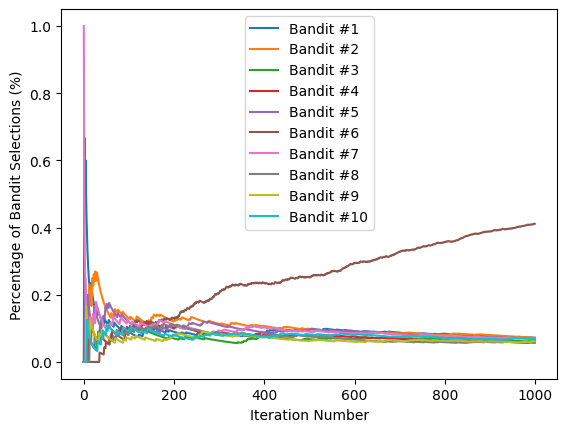

In [137]:
# Plot cumulative selection percentages for each bandit
# - Loop through each bandit to plot its cumulative selection percentage.
# - `selections_percentage[:, arm]` retrieves the percentage values for a specific bandit across all iterations.
for arm in range(n_bandits):
    plt.plot(selections_percentage[:, arm], label=f'Bandit #{arm+1}')  # Add a label for the bandit

plt.xlabel('Iteration Number')
plt.ylabel('Percentage of Bandit Selections (%)')
plt.legend()
plt.show()


In [138]:
# Print true probabilities of bandits
# - Loop through each bandit and its true probability to display the information.
# - Use `enumerate` for indexing and formatting probabilities to two decimal places.
for i, prob in enumerate(true_bandit_probs, 1):
    print(f"Bandit #{i} -> {prob:.2f}")

Bandit #1 -> 0.67
Bandit #2 -> 0.63
Bandit #3 -> 0.23
Bandit #4 -> 0.88
Bandit #5 -> 0.02
Bandit #6 -> 0.92
Bandit #7 -> 0.40
Bandit #8 -> 0.37
Bandit #9 -> 0.03
Bandit #10 -> 0.58


In [139]:
# Key Takeaway
# This is a multi-armed bandit problem, which is a foundational concept in RL. 
# While it's not directly Q-Learning or TD, it's related in that it explores the core principle of trial and error to maximize cumulative rewards.
# This strategy allowed the agent to discover through interaction the arm with the highest reward probability!